<a href="https://colab.research.google.com/github/apmalani/cs-172b-project/blob/main/circle_classifier.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import torch
import torch.nn as nn

class RecursiveBalanceLoss(nn.Module):
    def __init__(self, alpha=0.01, beta=0.1):
        super(RecursiveBalanceLoss, self).__init__()
        self.alpha = alpha  # Strength of the Top-Layer Gaussian Prior
        self.beta = beta    # Strength of the Hierarchical Balance Prior
        self.mse = nn.MSELoss()

    def forward(self, output, target, model):
        # 1. Likelihood (Error)
        loss = self.mse(output, target)

        # Extract weight matrices from Linear layers
        weights = [p for p in model.parameters() if len(p.shape) > 1]

        # 2. Top-Layer Gaussian Prior (centered at 0)
        # We apply this only to the last weight matrix (Output Layer)
        top_layer_weight = weights[-1]
        loss += self.alpha * torch.sum(top_layer_weight**2)

        # 3. Recursive Balance Penalty (Sequential Chain)
        # We iterate backwards: Layer L must balance with Layer L+1
        for i in range(len(weights) - 1):
            w_current_norm = torch.sum(weights[i]**2)
            w_next_norm = torch.sum(weights[i+1]**2)

            # This is the "Tension" term: (In_Cost - Out_Cost)^2
            loss += self.beta * (w_current_norm - w_next_norm)**2

        return loss


In [ ]:
class BalancedNet(nn.Module):
    def __init__(self):
        super(BalancedNet, self).__init__()
        self.layers = nn.Sequential(
            nn.Linear(2, 500),
            nn.ReLU(),
            nn.Linear(500, 2),   # The Bottleneck
            nn.ReLU(),
            nn.Linear(2, 20),
            nn.ReLU(),
            nn.Linear(20, 20),
            nn.ReLU(),
            nn.Linear(20, 1)    # Output Neuron
        )

    def forward(self, x):
        return self.layers(x)

In [ ]:
# @title
import numpy as np
import matplotlib.pyplot as plt
def plot_decision_boundaries(model, u_model, inputs, targets, epoch):
    # 1. Create a grid of points for the background contour
    x_range = np.linspace(-5, 5, 100)
    y_range = np.linspace(-5, 5, 100)
    xx, yy = np.meshgrid(x_range, y_range)
    grid_points = torch.tensor(np.c_[xx.ravel(), yy.ravel()], dtype=torch.float32)

    with torch.no_grad():
        preds = (model(grid_points) > 0.5).float().reshape(xx.shape)
        u_preds = (u_model(grid_points) > 0.5).float().reshape(xx.shape)

    # 2. Setup the Plot
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

    # Helper to plot data and boundaries
    def setup_subplot(ax, predictions, title, cmap_contour):
        # Plot the learned decision boundary (background)
        ax.contourf(xx, yy, predictions, alpha=0.2, cmap=cmap_contour)

        # Plot the actual data points
        # Filter for plotting: only plot points within a certain range so extreme outliers don't squash the view
        ax.scatter(inputs[:,0],inputs[:,1], c=targets)

        # Draw the "True" circle
        circle = plt.Circle((0, 0), 1.0, color='red', fill=False, linestyle='--', linewidth=2, label='True Boundary')
        ax.add_artist(circle)

        ax.set_title(title)
        ax.legend(loc='upper right', fontsize='small')

    # Execute plotting for both
    setup_subplot(ax1, preds, f'Balanced Model (Epoch {epoch})', 'Blues')
    setup_subplot(ax2, u_preds, f'Unbalanced Model (Epoch {epoch})', 'Reds')

    plt.suptitle(f"Decision Boundary Comparison at Epoch {epoch}")
    plt.tight_layout()
    plt.show()

In [ ]:
# @title
def get_accuracy(outputs, targets):
    # Apply threshold to get binary predictions (0 or 1)
    predictions = (outputs > 0.5).float()
    # Count how many predictions match the targets
    correct = (predictions == targets).float().sum()
    return correct / targets.shape[0]
def get_network_balance(model):
    """Calculates the mean squared difference between adjacent weight layer norms."""
    with torch.no_grad():
        # Get weight matrices (ignoring biases for balance calculation)
        weights = [p for p in model.parameters() if len(p.shape) > 1]
        norms = [torch.sum(w**2) for w in weights]

        diffs = []
        for i in range(len(norms) - 1):
            # (Layer_k_norm - Layer_k+1_norm)^2
            diffs.append((norms[i] - norms[i+1])**2)

        return torch.mean(torch.stack(diffs)).item()

Initial weight difference: 0.0


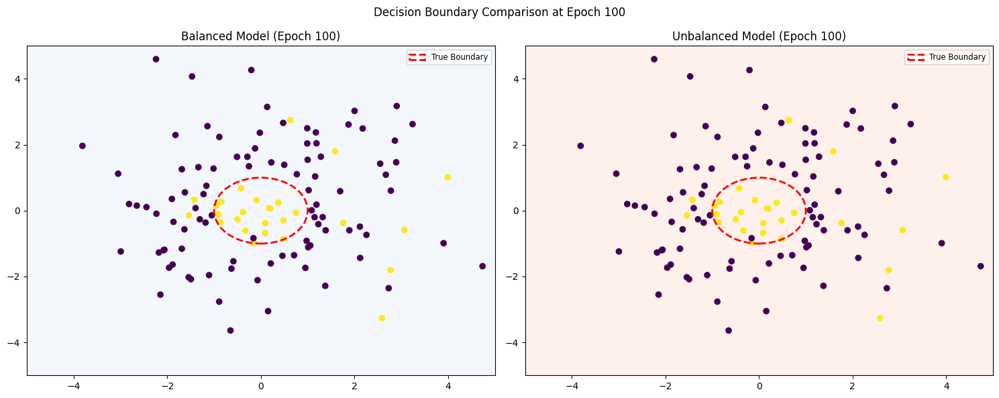

Epoch  100 | Balanced   - Loss: 9.4860, Acc: 77.50%, W_Norm: 217.49, Balance: 2889.4319
           | Unbalanced - Loss: 0.1745, Acc: 77.50%, W_Norm: 275.28, Balance: 6863.1470
----------------------------------------------------------------------------------------------------


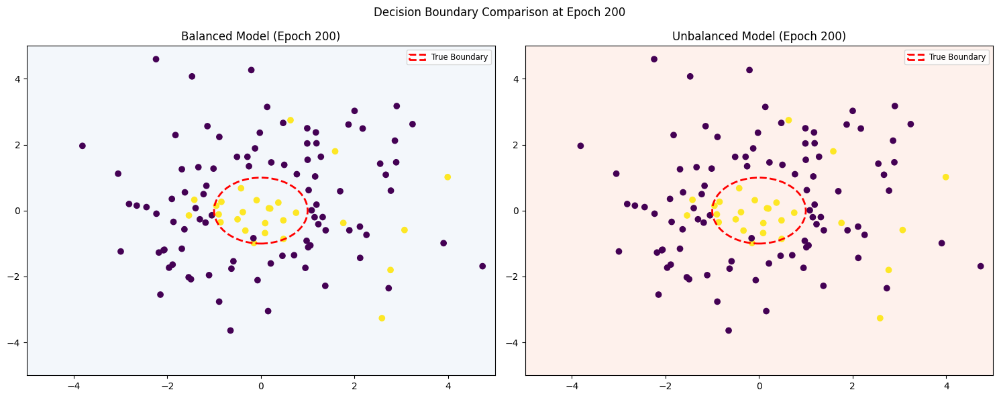

Epoch  200 | Balanced   - Loss: 5.2662, Acc: 77.50%, W_Norm: 190.04, Balance: 1583.9247
           | Unbalanced - Loss: 0.1685, Acc: 77.50%, W_Norm: 275.30, Balance: 6863.0151
----------------------------------------------------------------------------------------------------


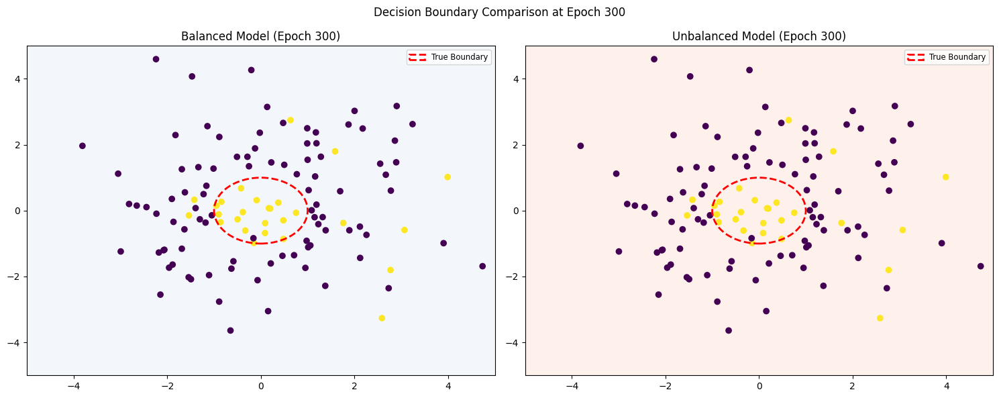

Epoch  300 | Balanced   - Loss: 3.3581, Acc: 77.50%, W_Norm: 173.97, Balance: 992.6898
           | Unbalanced - Loss: 0.1652, Acc: 77.50%, W_Norm: 275.33, Balance: 6862.8931
----------------------------------------------------------------------------------------------------


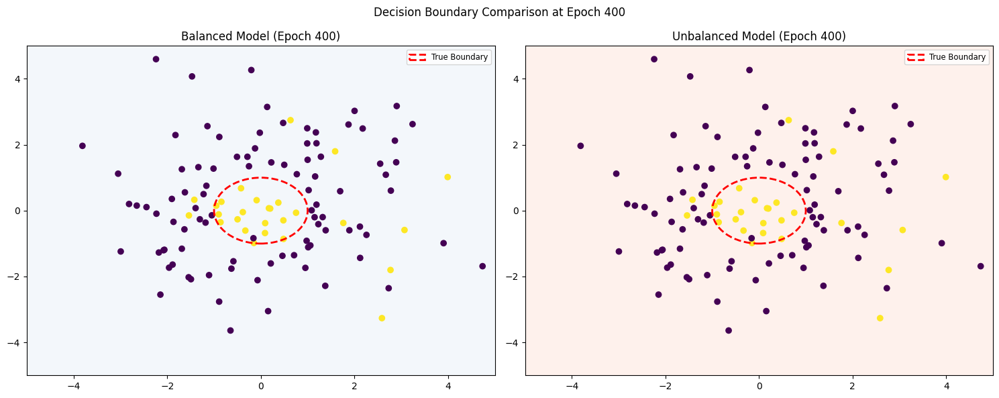

Epoch  400 | Balanced   - Loss: 2.3348, Acc: 77.50%, W_Norm: 163.49, Balance: 675.4370
           | Unbalanced - Loss: 0.1616, Acc: 77.50%, W_Norm: 275.36, Balance: 6862.7812
----------------------------------------------------------------------------------------------------


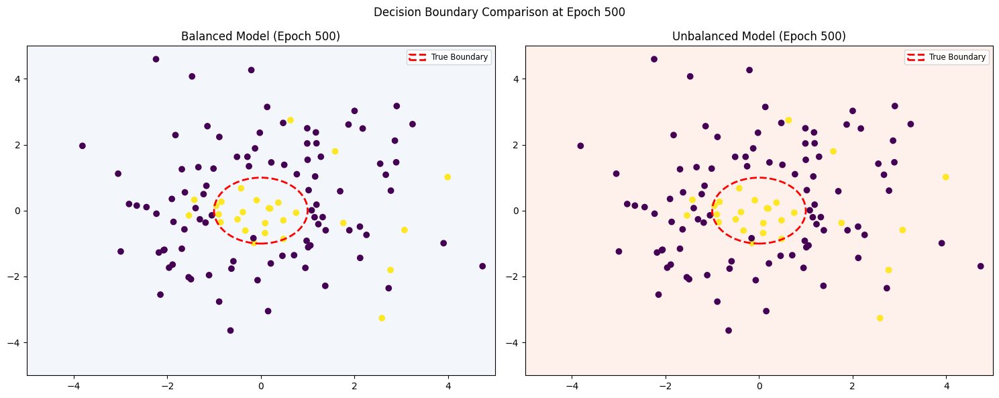

Epoch  500 | Balanced   - Loss: 1.7220, Acc: 77.50%, W_Norm: 156.18, Balance: 485.5837
           | Unbalanced - Loss: 0.1575, Acc: 77.50%, W_Norm: 275.41, Balance: 6862.6357
----------------------------------------------------------------------------------------------------


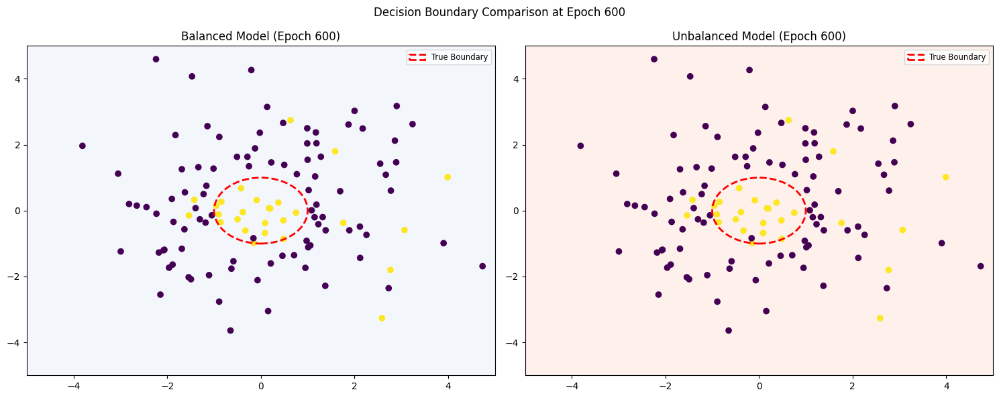

Epoch  600 | Balanced   - Loss: 1.3259, Acc: 77.50%, W_Norm: 150.83, Balance: 363.0020
           | Unbalanced - Loss: 0.1531, Acc: 77.50%, W_Norm: 275.47, Balance: 6862.4639
----------------------------------------------------------------------------------------------------


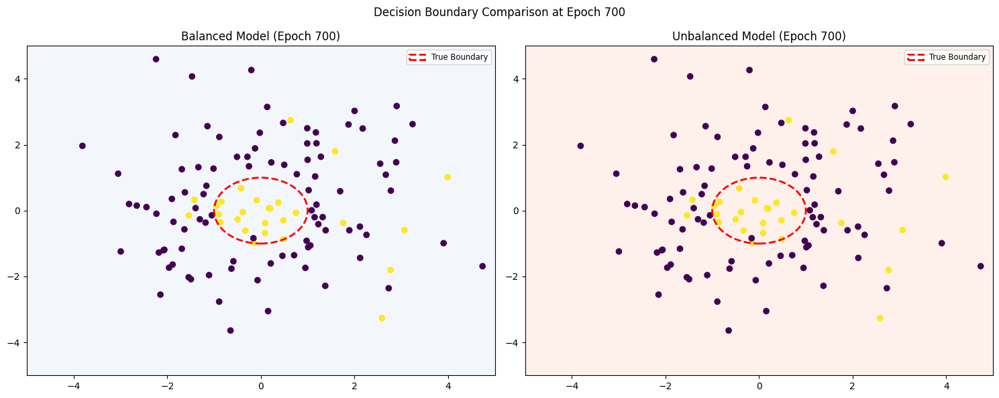

Epoch  700 | Balanced   - Loss: 1.0550, Acc: 77.50%, W_Norm: 146.79, Balance: 279.3411
           | Unbalanced - Loss: 0.1484, Acc: 77.50%, W_Norm: 275.54, Balance: 6862.3115
----------------------------------------------------------------------------------------------------


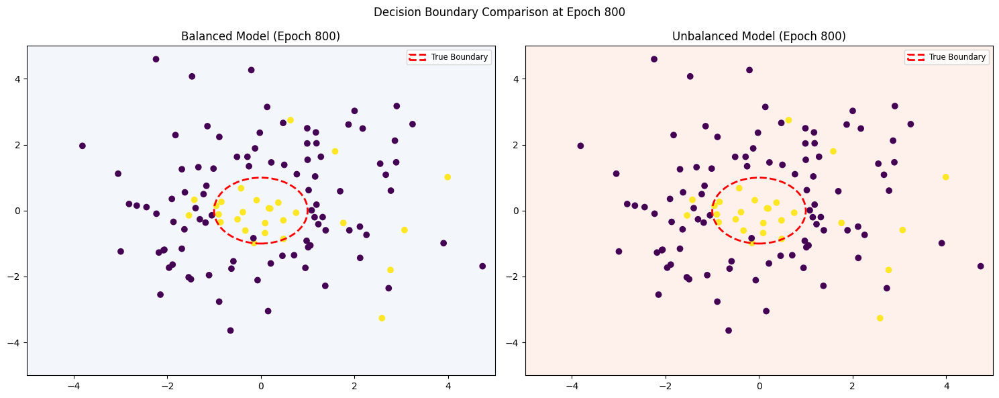

Epoch  800 | Balanced   - Loss: 0.8614, Acc: 77.50%, W_Norm: 143.67, Balance: 219.7793
           | Unbalanced - Loss: 0.1432, Acc: 77.50%, W_Norm: 275.63, Balance: 6862.1924
----------------------------------------------------------------------------------------------------


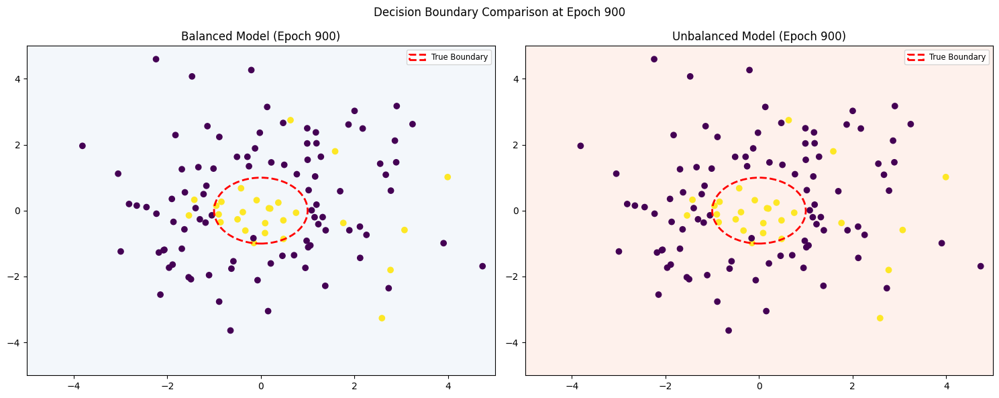

Epoch  900 | Balanced   - Loss: 0.7185, Acc: 77.50%, W_Norm: 141.21, Balance: 175.9841
           | Unbalanced - Loss: 0.1381, Acc: 77.50%, W_Norm: 275.72, Balance: 6862.0688
----------------------------------------------------------------------------------------------------


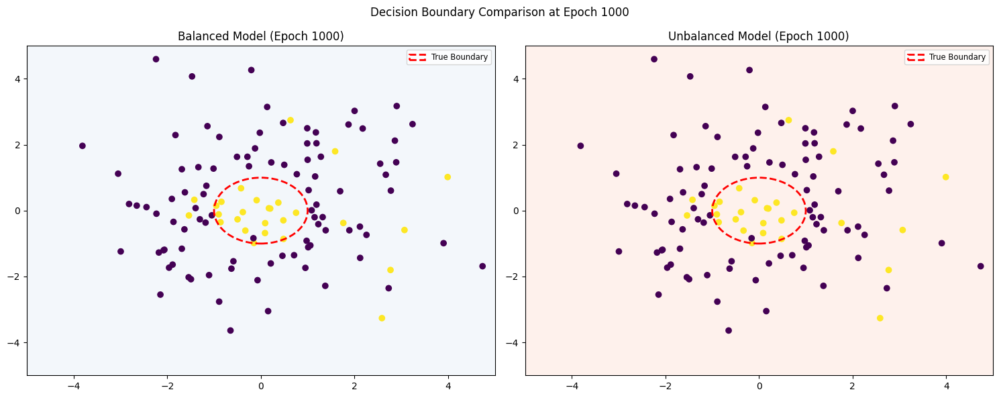

Epoch 1000 | Balanced   - Loss: 0.6099, Acc: 77.50%, W_Norm: 139.24, Balance: 142.9234
           | Unbalanced - Loss: 0.1327, Acc: 77.50%, W_Norm: 275.83, Balance: 6862.0044
----------------------------------------------------------------------------------------------------


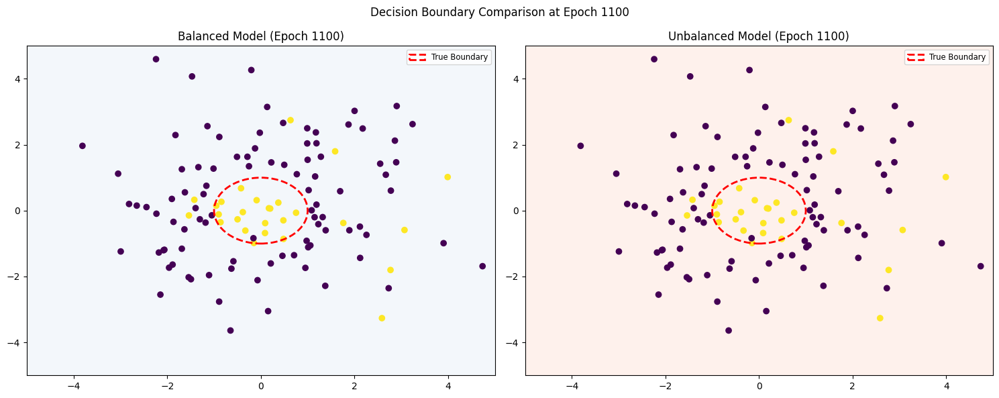

Epoch 1100 | Balanced   - Loss: 0.5257, Acc: 77.50%, W_Norm: 137.65, Balance: 117.4535
           | Unbalanced - Loss: 0.1272, Acc: 77.50%, W_Norm: 275.95, Balance: 6861.9121
----------------------------------------------------------------------------------------------------


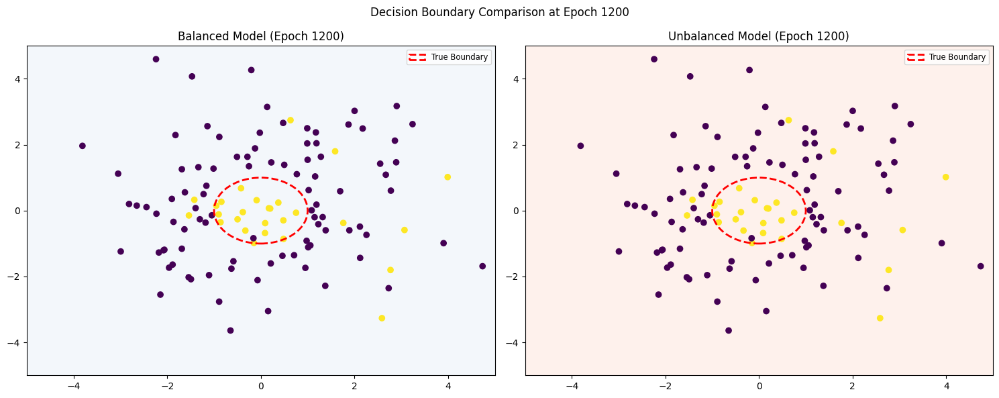

Epoch 1200 | Balanced   - Loss: 0.4593, Acc: 77.50%, W_Norm: 136.35, Balance:  97.5162
           | Unbalanced - Loss: 0.1217, Acc: 77.50%, W_Norm: 276.07, Balance: 6861.8501
----------------------------------------------------------------------------------------------------


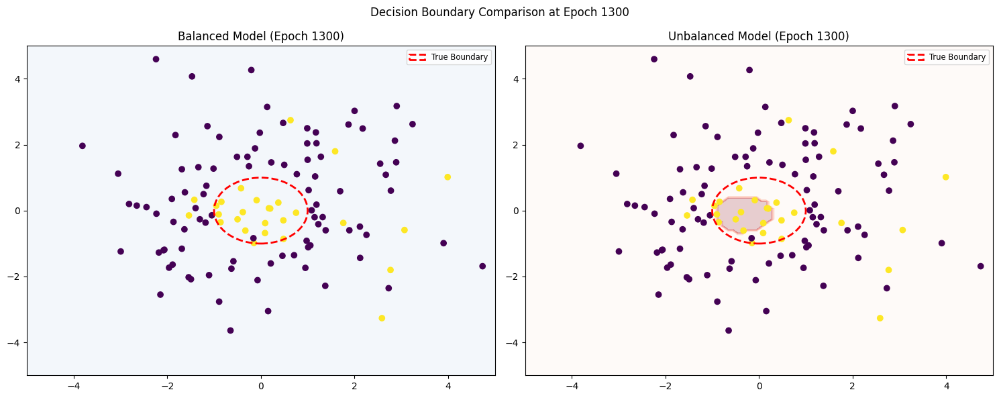

Epoch 1300 | Balanced   - Loss: 0.4061, Acc: 77.50%, W_Norm: 135.29, Balance:  81.6980
           | Unbalanced - Loss: 0.1161, Acc: 84.17%, W_Norm: 276.20, Balance: 6861.8184
----------------------------------------------------------------------------------------------------


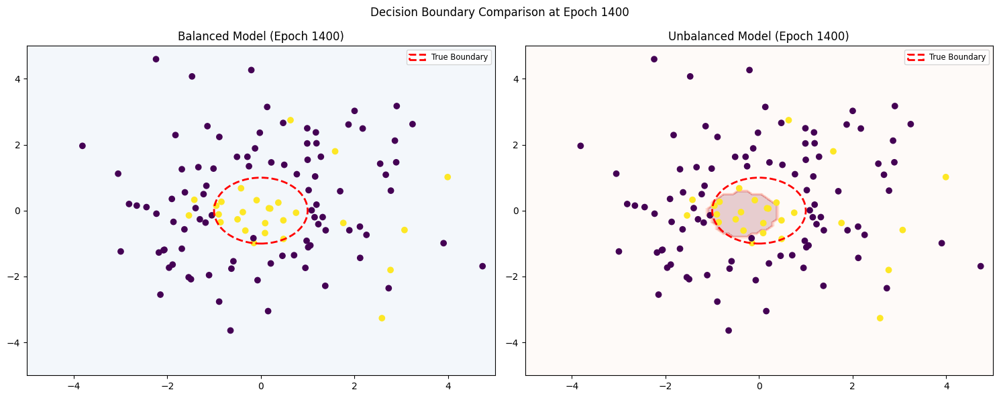

Epoch 1400 | Balanced   - Loss: 0.3629, Acc: 77.50%, W_Norm: 134.41, Balance:  69.0122
           | Unbalanced - Loss: 0.1107, Acc: 85.83%, W_Norm: 276.34, Balance: 6861.7510
----------------------------------------------------------------------------------------------------


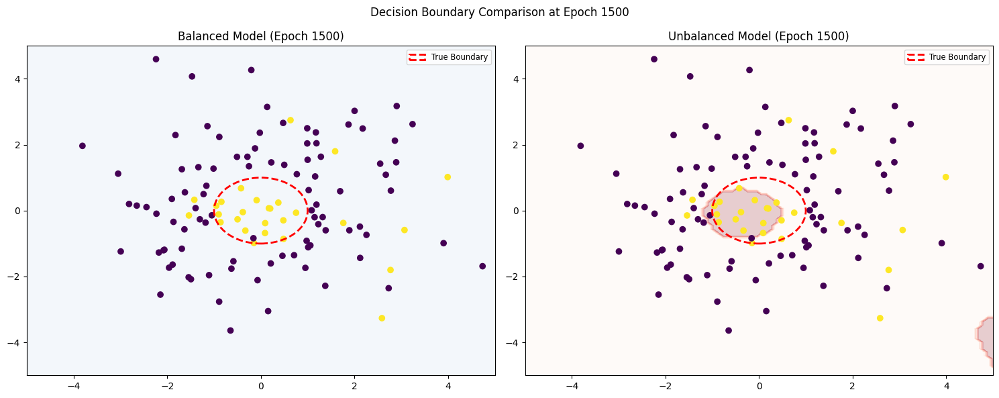

Epoch 1500 | Balanced   - Loss: 0.3274, Acc: 77.50%, W_Norm: 133.69, Balance:  58.7544
           | Unbalanced - Loss: 0.1050, Acc: 87.50%, W_Norm: 276.48, Balance: 6861.6836
----------------------------------------------------------------------------------------------------


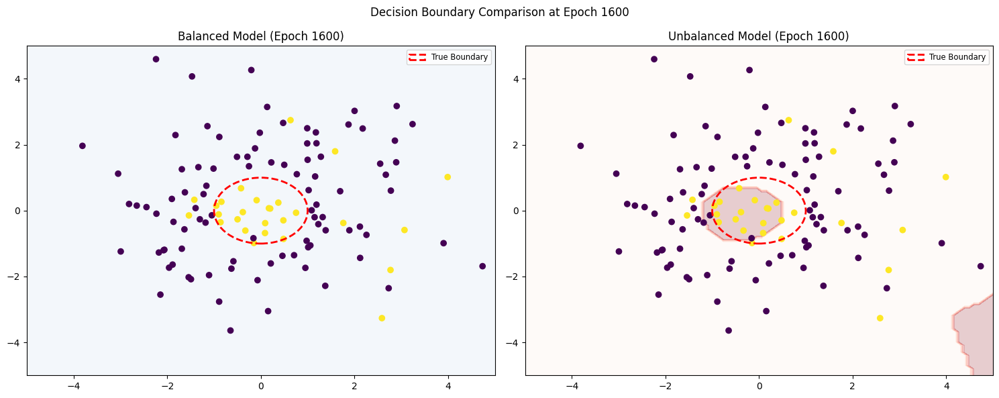

Epoch 1600 | Balanced   - Loss: 0.2980, Acc: 77.50%, W_Norm: 133.08, Balance:  50.4017
           | Unbalanced - Loss: 0.0999, Acc: 88.33%, W_Norm: 276.63, Balance: 6861.4790
----------------------------------------------------------------------------------------------------


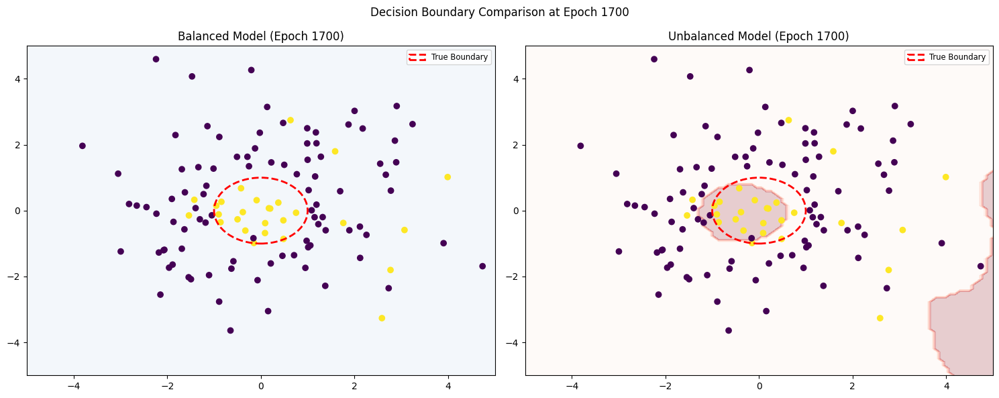

Epoch 1700 | Balanced   - Loss: 0.2734, Acc: 77.50%, W_Norm: 132.58, Balance:  43.5636
           | Unbalanced - Loss: 0.0956, Acc: 87.50%, W_Norm: 276.77, Balance: 6861.2173
----------------------------------------------------------------------------------------------------


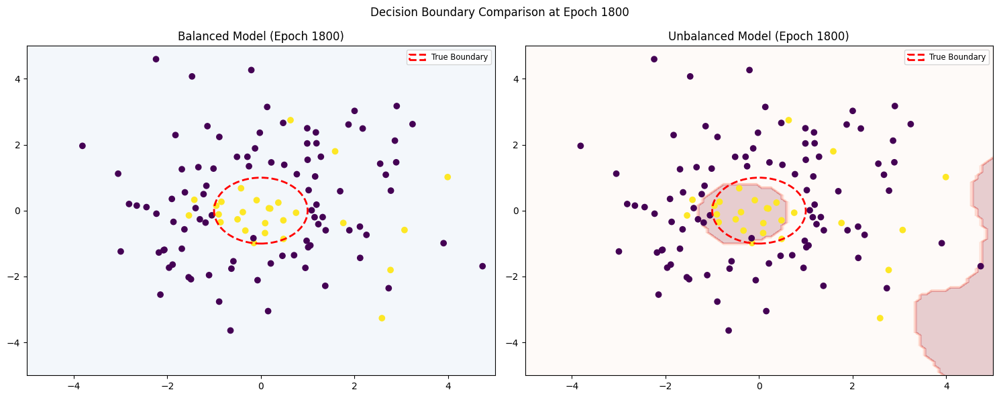

Epoch 1800 | Balanced   - Loss: 0.2524, Acc: 77.50%, W_Norm: 132.17, Balance:  37.9212
           | Unbalanced - Loss: 0.0921, Acc: 86.67%, W_Norm: 276.91, Balance: 6860.8672
----------------------------------------------------------------------------------------------------


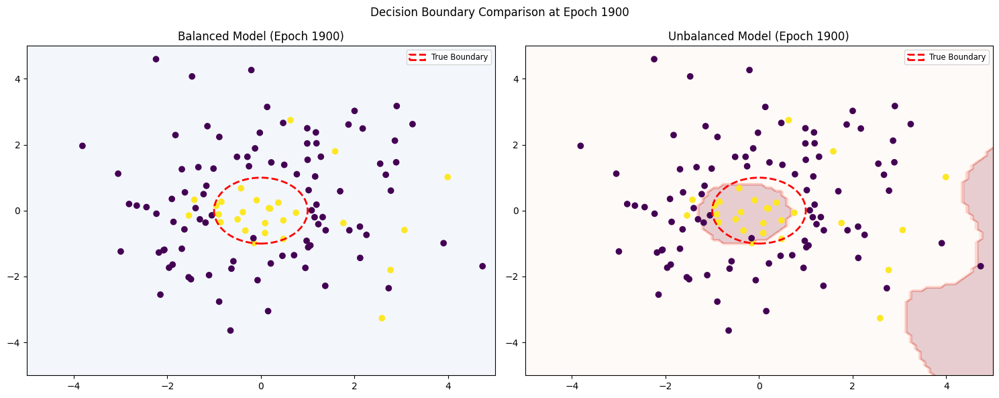

Epoch 1900 | Balanced   - Loss: 0.2340, Acc: 77.50%, W_Norm: 131.83, Balance:  33.2544
           | Unbalanced - Loss: 0.0892, Acc: 86.67%, W_Norm: 277.03, Balance: 6860.5303
----------------------------------------------------------------------------------------------------


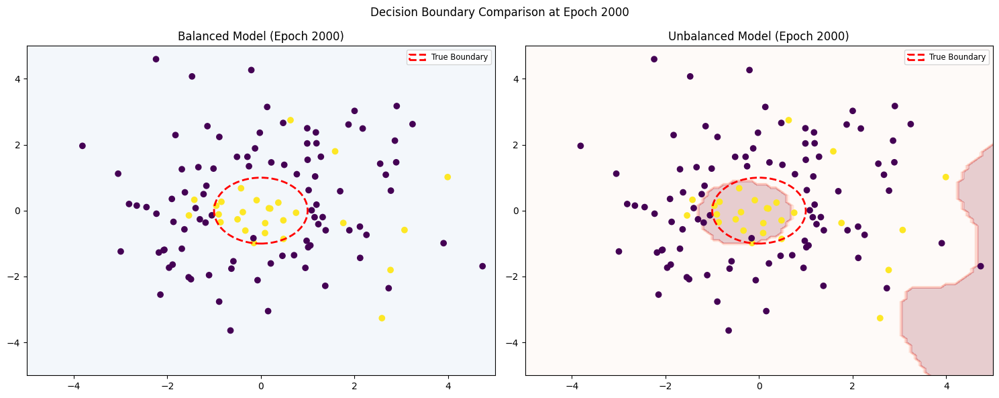

Epoch 2000 | Balanced   - Loss: 0.2178, Acc: 77.50%, W_Norm: 131.55, Balance:  29.3817
           | Unbalanced - Loss: 0.0869, Acc: 87.50%, W_Norm: 277.14, Balance: 6860.2339
----------------------------------------------------------------------------------------------------


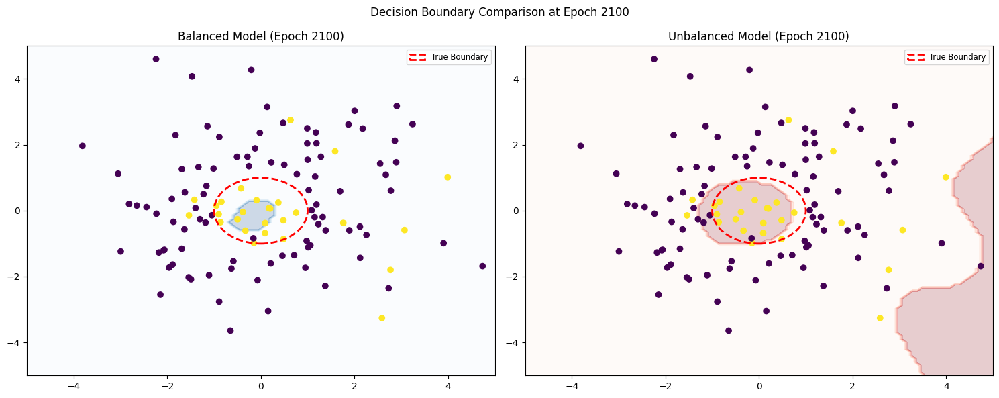

Epoch 2100 | Balanced   - Loss: 0.2031, Acc: 83.33%, W_Norm: 131.32, Balance:  26.1422
           | Unbalanced - Loss: 0.0849, Acc: 87.50%, W_Norm: 277.24, Balance: 6860.0024
----------------------------------------------------------------------------------------------------


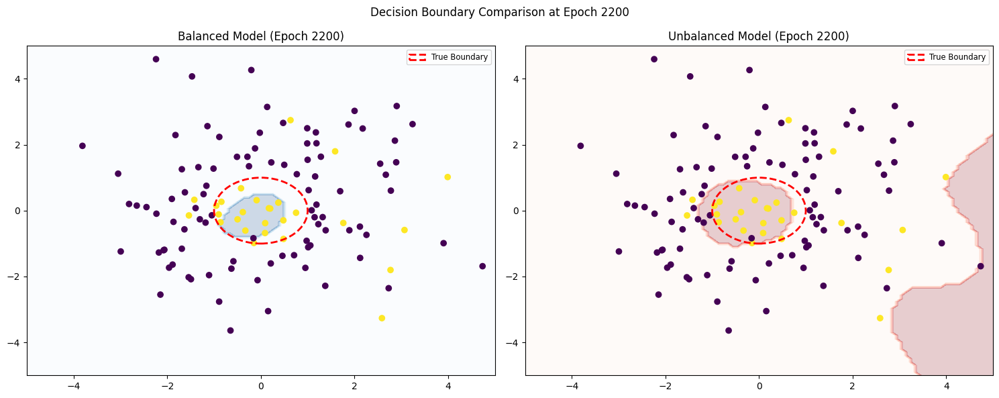

Epoch 2200 | Balanced   - Loss: 0.1903, Acc: 85.83%, W_Norm: 131.14, Balance:  23.4197
           | Unbalanced - Loss: 0.0833, Acc: 87.50%, W_Norm: 277.33, Balance: 6859.8047
----------------------------------------------------------------------------------------------------


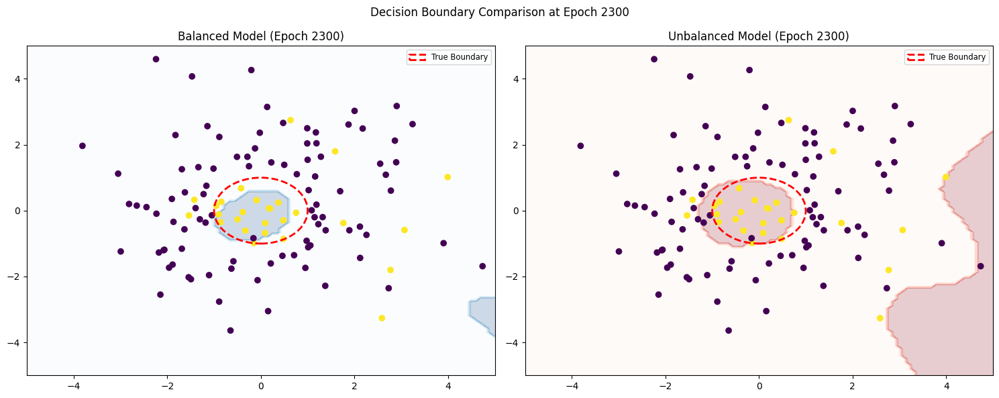

Epoch 2300 | Balanced   - Loss: 0.1789, Acc: 86.67%, W_Norm: 131.00, Balance:  21.1312
           | Unbalanced - Loss: 0.0819, Acc: 88.33%, W_Norm: 277.42, Balance: 6859.6836
----------------------------------------------------------------------------------------------------


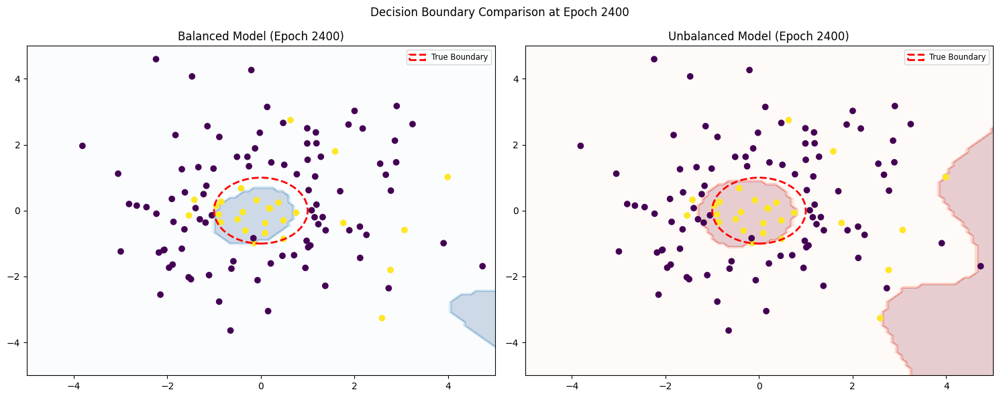

Epoch 2400 | Balanced   - Loss: 0.1688, Acc: 86.67%, W_Norm: 130.89, Balance:  19.2001
           | Unbalanced - Loss: 0.0808, Acc: 89.17%, W_Norm: 277.49, Balance: 6859.6045
----------------------------------------------------------------------------------------------------


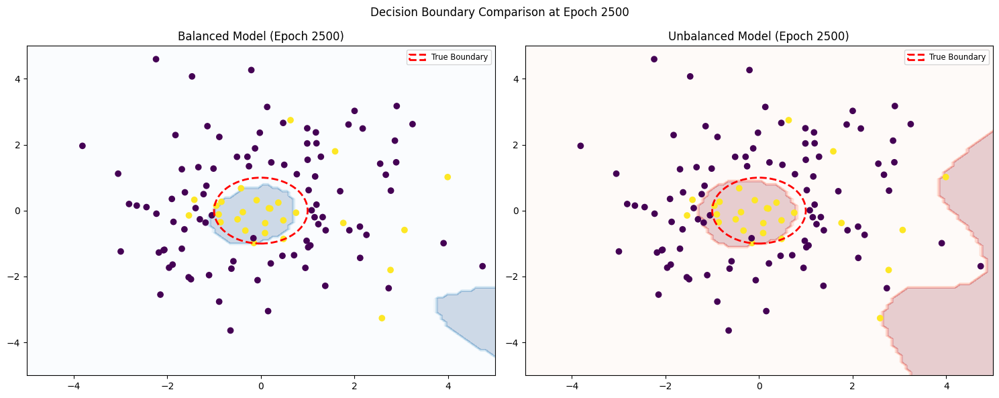

Epoch 2500 | Balanced   - Loss: 0.1596, Acc: 87.50%, W_Norm: 130.80, Balance:  17.5647
           | Unbalanced - Loss: 0.0797, Acc: 90.00%, W_Norm: 277.55, Balance: 6859.5200
----------------------------------------------------------------------------------------------------


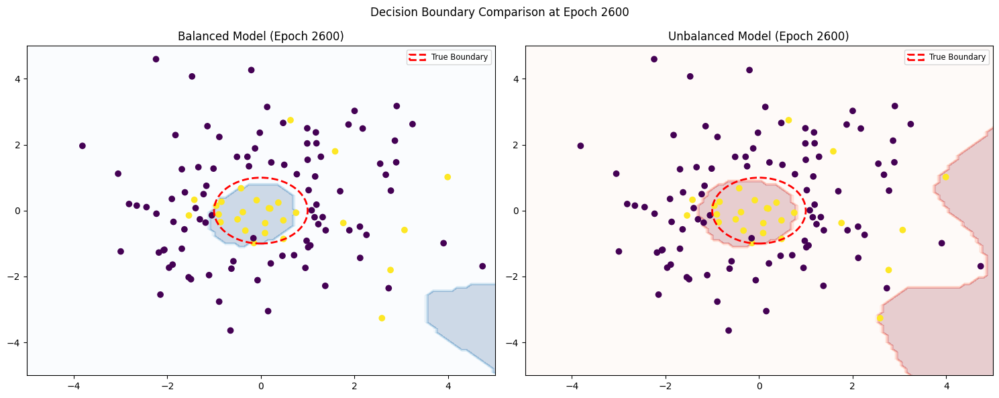

Epoch 2600 | Balanced   - Loss: 0.1511, Acc: 90.00%, W_Norm: 130.74, Balance:  16.1694
           | Unbalanced - Loss: 0.0787, Acc: 90.83%, W_Norm: 277.61, Balance: 6859.5366
----------------------------------------------------------------------------------------------------


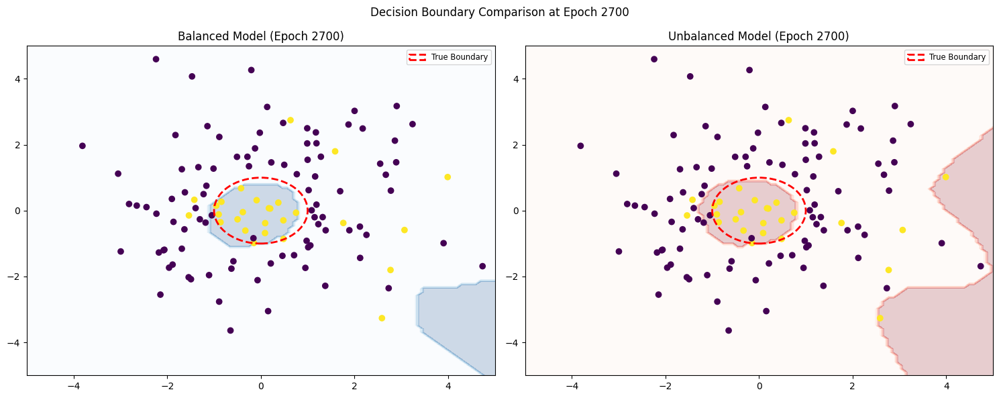

Epoch 2700 | Balanced   - Loss: 0.1436, Acc: 90.00%, W_Norm: 130.70, Balance:  14.9782
           | Unbalanced - Loss: 0.0778, Acc: 90.83%, W_Norm: 277.66, Balance: 6859.4692
----------------------------------------------------------------------------------------------------


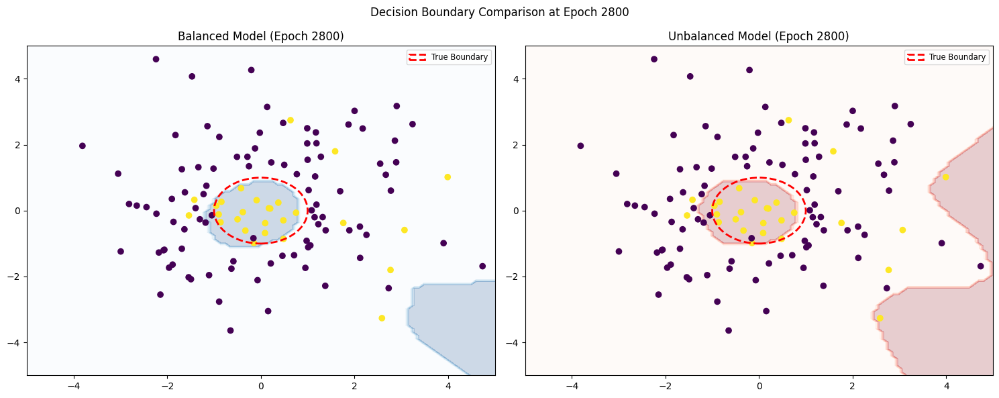

Epoch 2800 | Balanced   - Loss: 0.1369, Acc: 90.00%, W_Norm: 130.67, Balance:  13.9537
           | Unbalanced - Loss: 0.0769, Acc: 91.67%, W_Norm: 277.71, Balance: 6859.3931
----------------------------------------------------------------------------------------------------


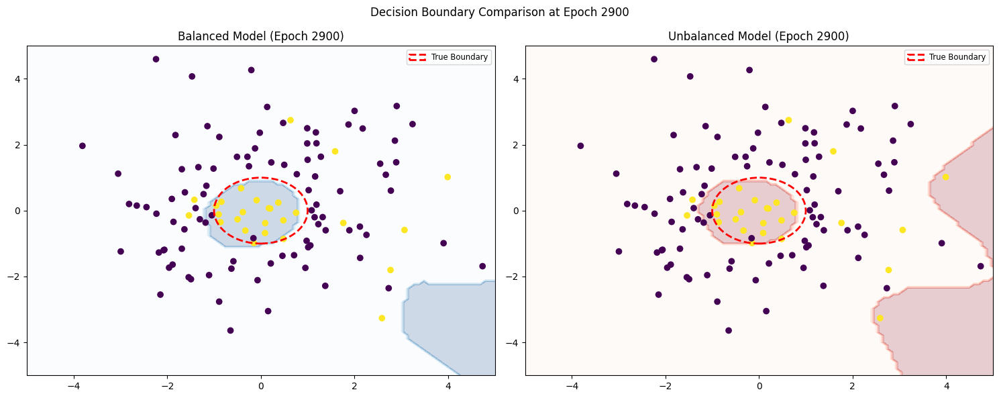

Epoch 2900 | Balanced   - Loss: 0.1308, Acc: 90.00%, W_Norm: 130.66, Balance:  13.0692
           | Unbalanced - Loss: 0.0761, Acc: 91.67%, W_Norm: 277.76, Balance: 6859.3193
----------------------------------------------------------------------------------------------------


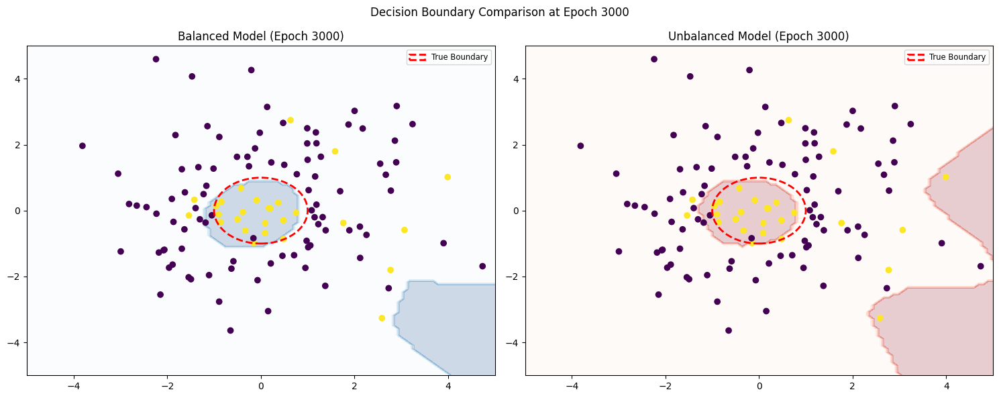

Epoch 3000 | Balanced   - Loss: 0.1252, Acc: 90.00%, W_Norm: 130.65, Balance:  12.3013
           | Unbalanced - Loss: 0.0753, Acc: 91.67%, W_Norm: 277.81, Balance: 6859.2192
----------------------------------------------------------------------------------------------------


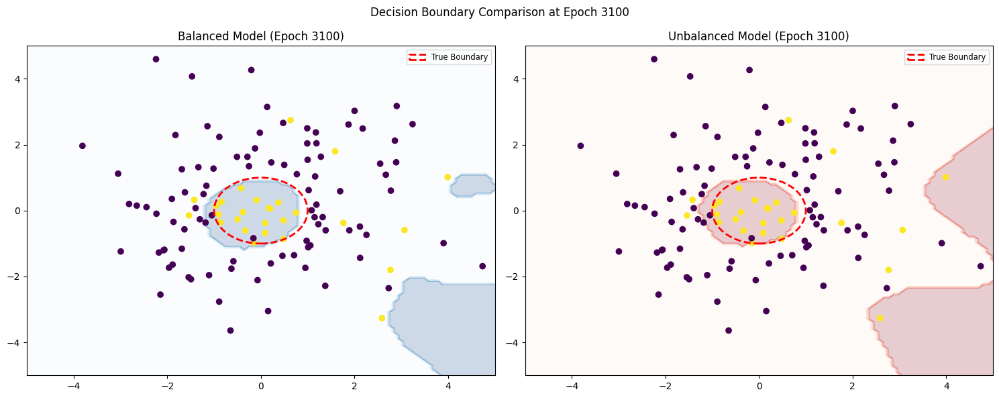

Epoch 3100 | Balanced   - Loss: 0.1202, Acc: 89.17%, W_Norm: 130.65, Balance:  11.6309
           | Unbalanced - Loss: 0.0746, Acc: 91.67%, W_Norm: 277.85, Balance: 6859.1201
----------------------------------------------------------------------------------------------------


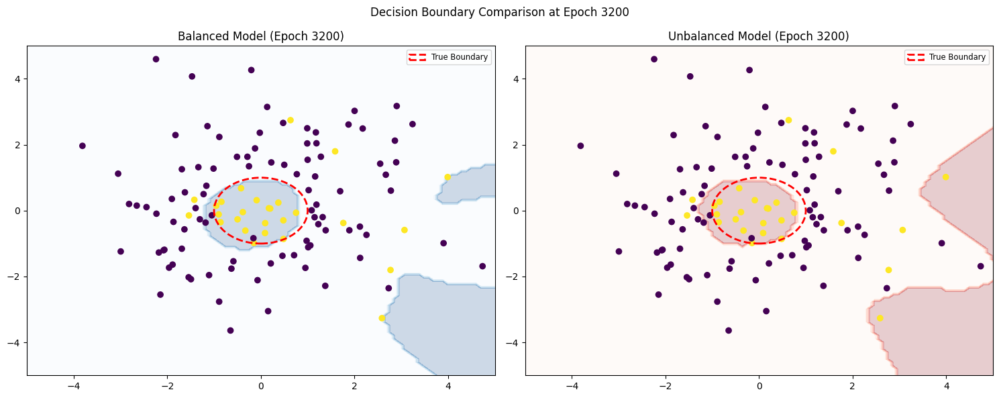

Epoch 3200 | Balanced   - Loss: 0.1157, Acc: 90.00%, W_Norm: 130.66, Balance:  11.0416
           | Unbalanced - Loss: 0.0739, Acc: 91.67%, W_Norm: 277.89, Balance: 6859.0078
----------------------------------------------------------------------------------------------------


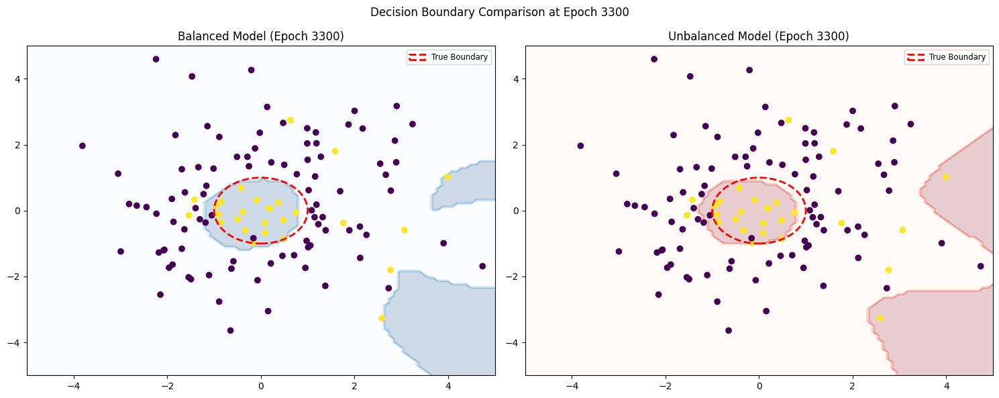

Epoch 3300 | Balanced   - Loss: 0.1116, Acc: 90.83%, W_Norm: 130.67, Balance:  10.5256
           | Unbalanced - Loss: 0.0733, Acc: 91.67%, W_Norm: 277.93, Balance: 6858.8906
----------------------------------------------------------------------------------------------------


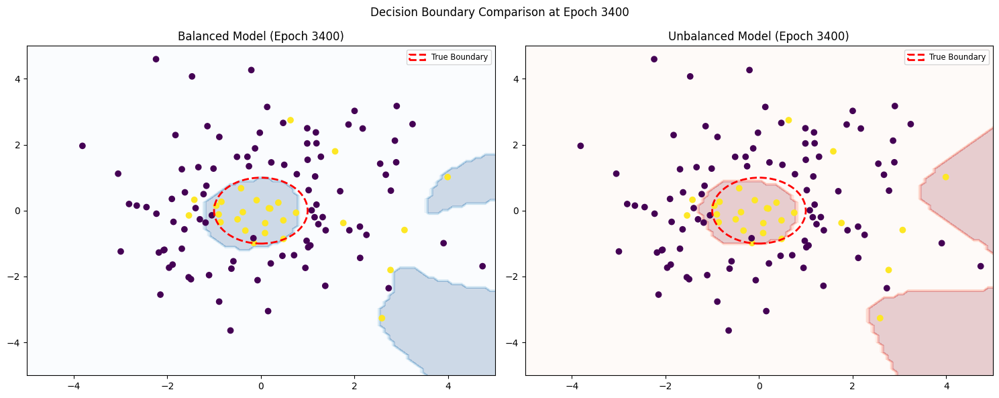

Epoch 3400 | Balanced   - Loss: 0.1079, Acc: 91.67%, W_Norm: 130.68, Balance:  10.0664
           | Unbalanced - Loss: 0.0726, Acc: 91.67%, W_Norm: 277.96, Balance: 6858.7485
----------------------------------------------------------------------------------------------------


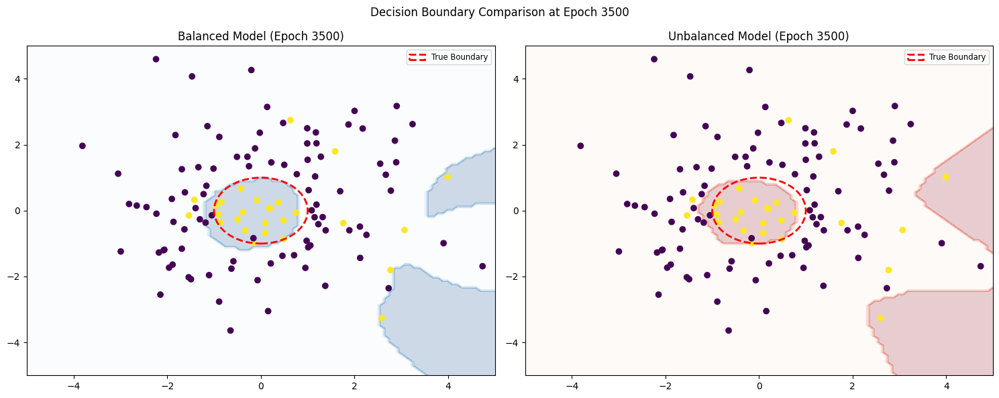

Epoch 3500 | Balanced   - Loss: 0.1045, Acc: 91.67%, W_Norm: 130.69, Balance:   9.6551
           | Unbalanced - Loss: 0.0720, Acc: 91.67%, W_Norm: 278.00, Balance: 6858.6040
----------------------------------------------------------------------------------------------------


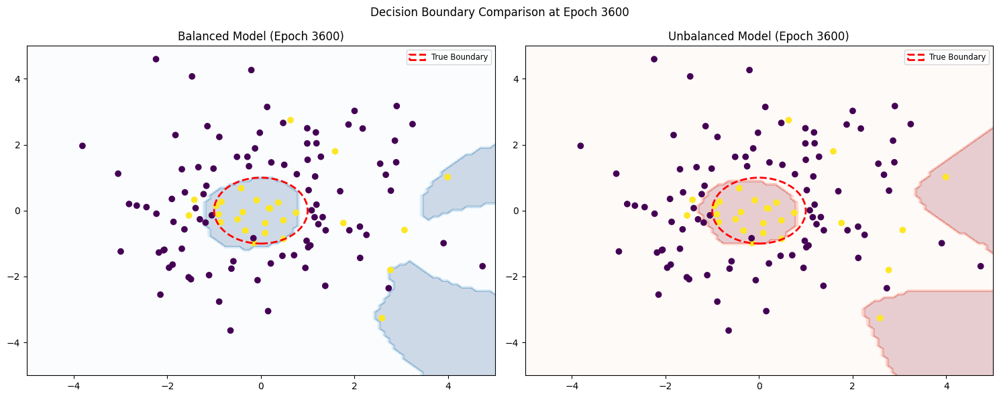

Epoch 3600 | Balanced   - Loss: 0.1014, Acc: 92.50%, W_Norm: 130.70, Balance:   9.2845
           | Unbalanced - Loss: 0.0714, Acc: 91.67%, W_Norm: 278.04, Balance: 6858.4409
----------------------------------------------------------------------------------------------------


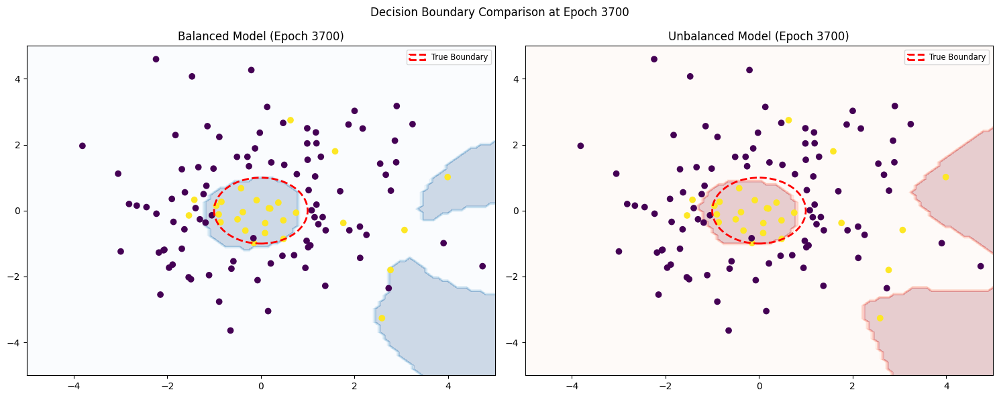

Epoch 3700 | Balanced   - Loss: 0.0985, Acc: 92.50%, W_Norm: 130.71, Balance:   8.9473
           | Unbalanced - Loss: 0.0708, Acc: 91.67%, W_Norm: 278.08, Balance: 6858.2705
----------------------------------------------------------------------------------------------------


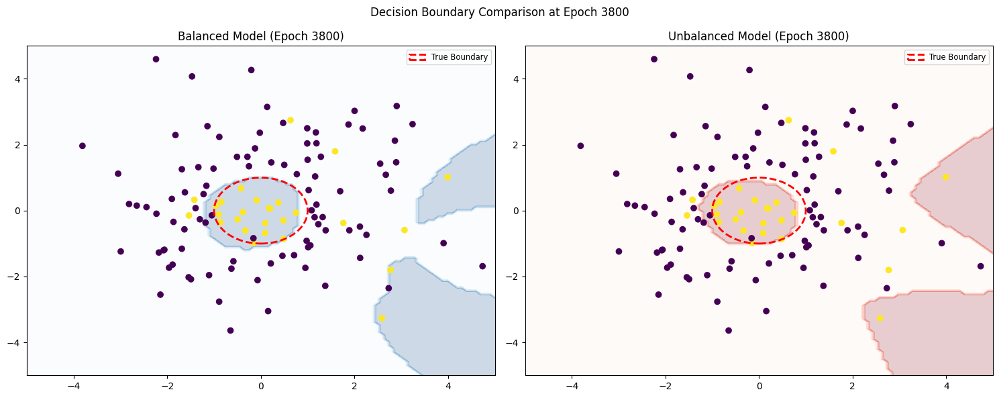

Epoch 3800 | Balanced   - Loss: 0.0960, Acc: 92.50%, W_Norm: 130.71, Balance:   8.6405
           | Unbalanced - Loss: 0.0702, Acc: 91.67%, W_Norm: 278.11, Balance: 6858.0698
----------------------------------------------------------------------------------------------------


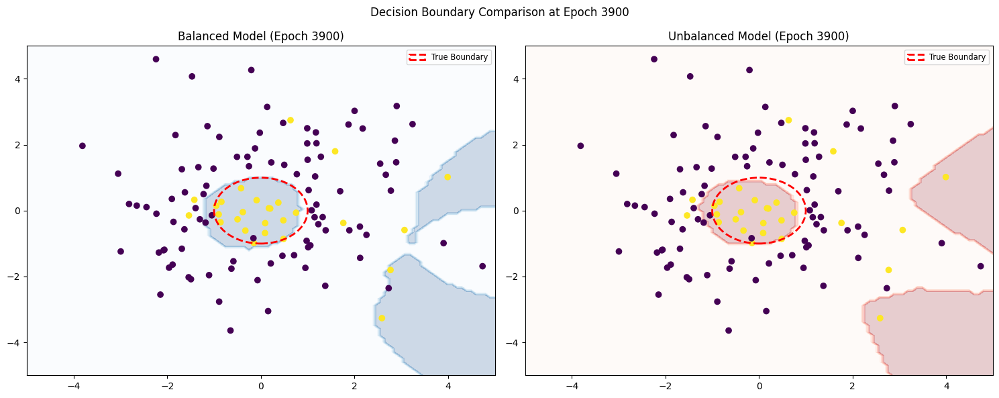

Epoch 3900 | Balanced   - Loss: 0.0938, Acc: 91.67%, W_Norm: 130.71, Balance:   8.3606
           | Unbalanced - Loss: 0.0696, Acc: 91.67%, W_Norm: 278.15, Balance: 6857.8037
----------------------------------------------------------------------------------------------------


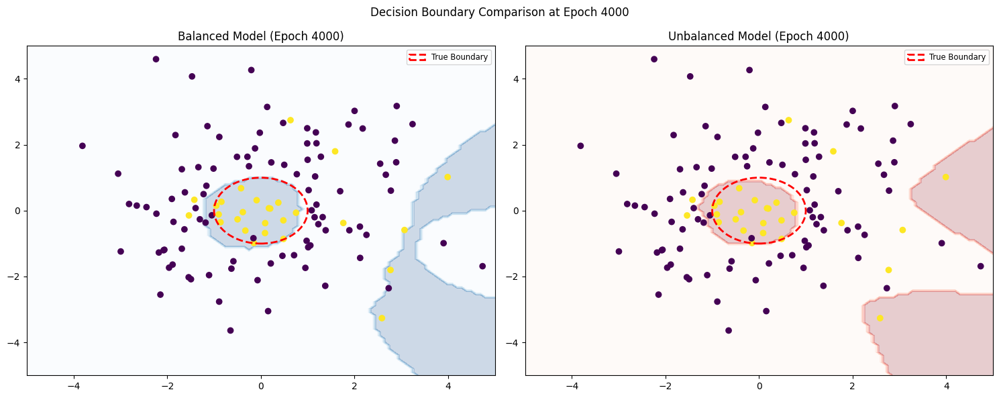

Epoch 4000 | Balanced   - Loss: 0.0918, Acc: 91.67%, W_Norm: 130.71, Balance:   8.1022
           | Unbalanced - Loss: 0.0690, Acc: 91.67%, W_Norm: 278.19, Balance: 6857.5034
----------------------------------------------------------------------------------------------------


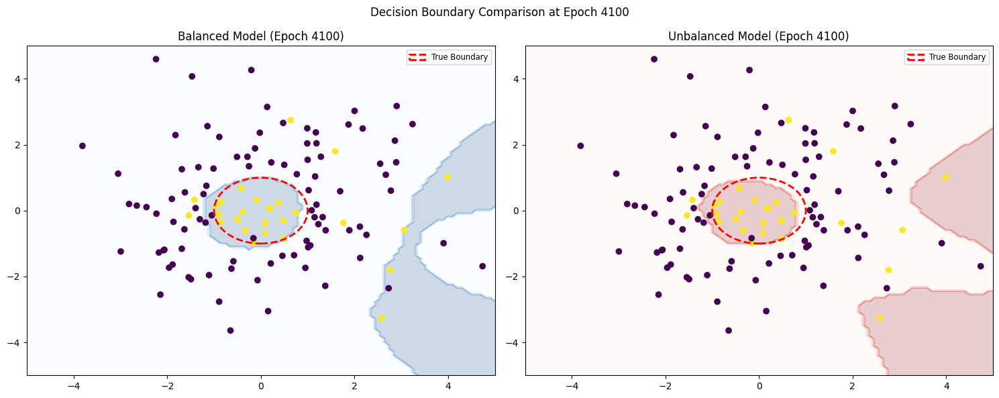

Epoch 4100 | Balanced   - Loss: 0.0899, Acc: 93.33%, W_Norm: 130.70, Balance:   7.8656
           | Unbalanced - Loss: 0.0684, Acc: 91.67%, W_Norm: 278.23, Balance: 6857.2046
----------------------------------------------------------------------------------------------------


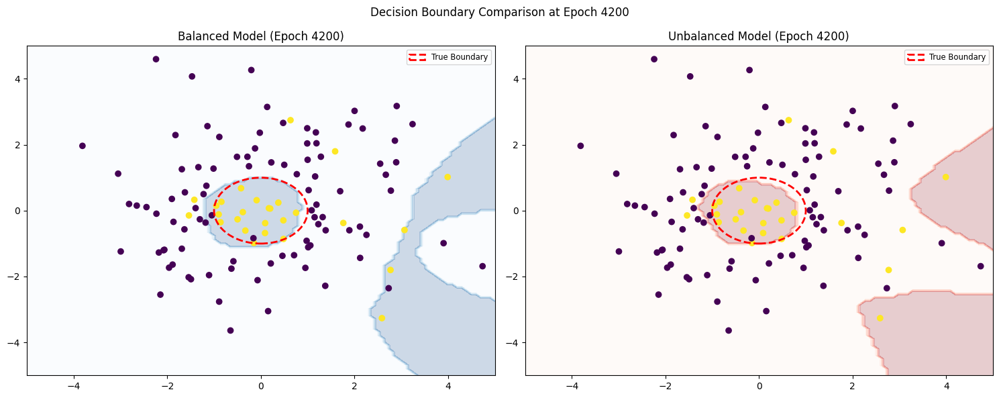

Epoch 4200 | Balanced   - Loss: 0.0883, Acc: 93.33%, W_Norm: 130.69, Balance:   7.6469
           | Unbalanced - Loss: 0.0678, Acc: 92.50%, W_Norm: 278.27, Balance: 6856.9165
----------------------------------------------------------------------------------------------------


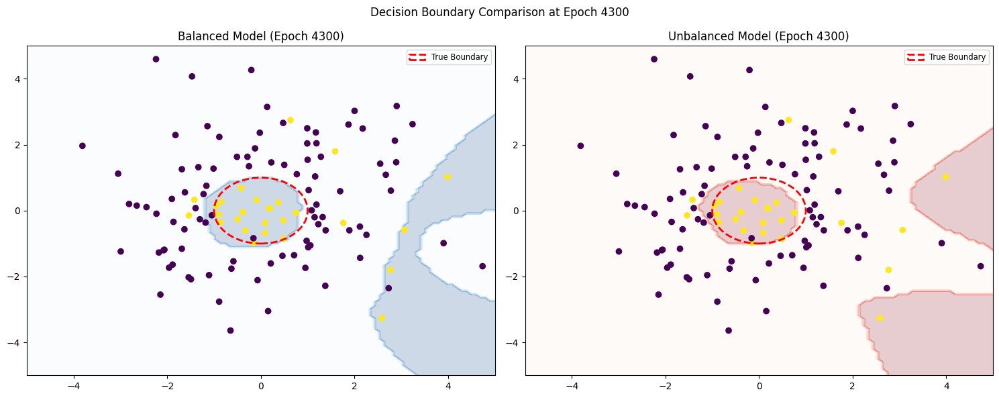

Epoch 4300 | Balanced   - Loss: 0.0868, Acc: 93.33%, W_Norm: 130.68, Balance:   7.4451
           | Unbalanced - Loss: 0.0671, Acc: 92.50%, W_Norm: 278.31, Balance: 6856.6196
----------------------------------------------------------------------------------------------------


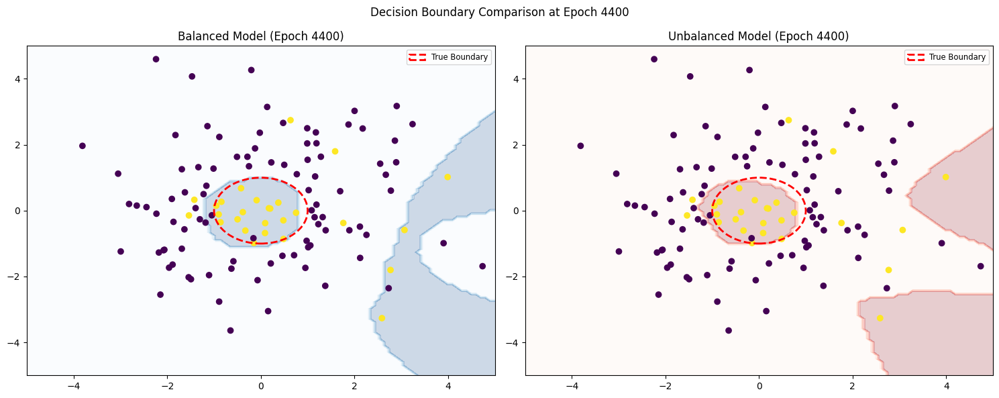

Epoch 4400 | Balanced   - Loss: 0.0854, Acc: 93.33%, W_Norm: 130.67, Balance:   7.2568
           | Unbalanced - Loss: 0.0665, Acc: 92.50%, W_Norm: 278.35, Balance: 6856.3091
----------------------------------------------------------------------------------------------------


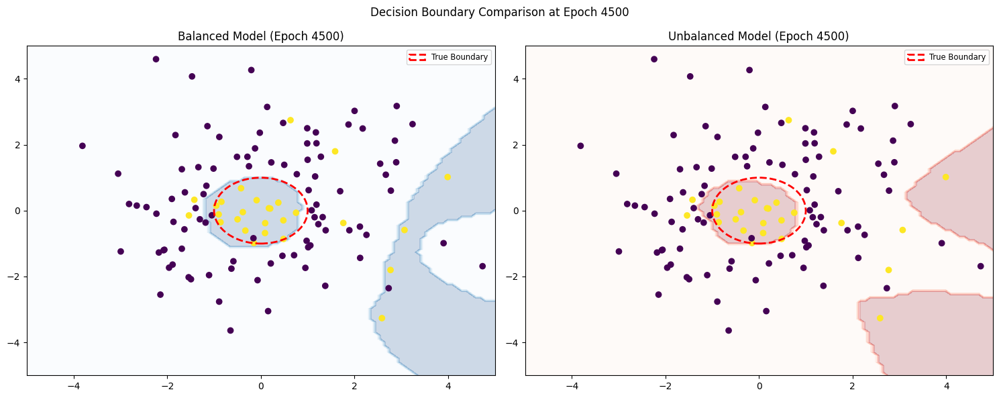

Epoch 4500 | Balanced   - Loss: 0.0841, Acc: 93.33%, W_Norm: 130.65, Balance:   7.0821
           | Unbalanced - Loss: 0.0659, Acc: 92.50%, W_Norm: 278.39, Balance: 6855.9868
----------------------------------------------------------------------------------------------------


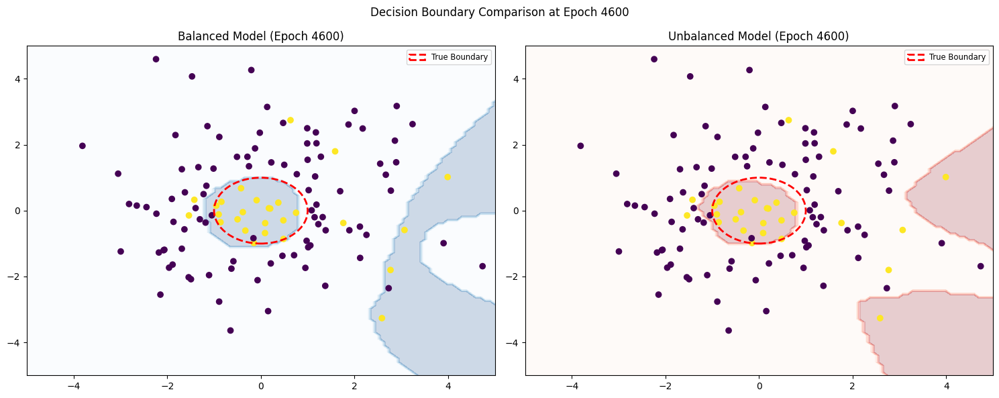

Epoch 4600 | Balanced   - Loss: 0.0830, Acc: 93.33%, W_Norm: 130.64, Balance:   6.9197
           | Unbalanced - Loss: 0.0654, Acc: 92.50%, W_Norm: 278.43, Balance: 6855.5908
----------------------------------------------------------------------------------------------------


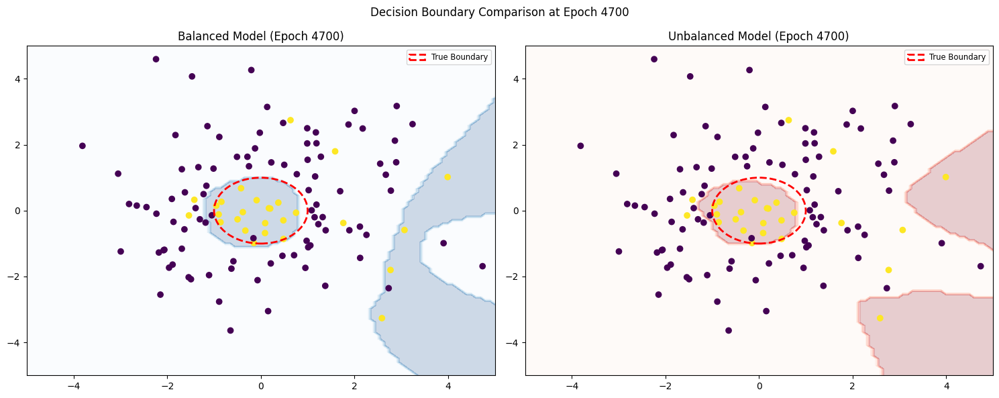

Epoch 4700 | Balanced   - Loss: 0.0819, Acc: 93.33%, W_Norm: 130.62, Balance:   6.7682
           | Unbalanced - Loss: 0.0649, Acc: 92.50%, W_Norm: 278.47, Balance: 6855.1460
----------------------------------------------------------------------------------------------------


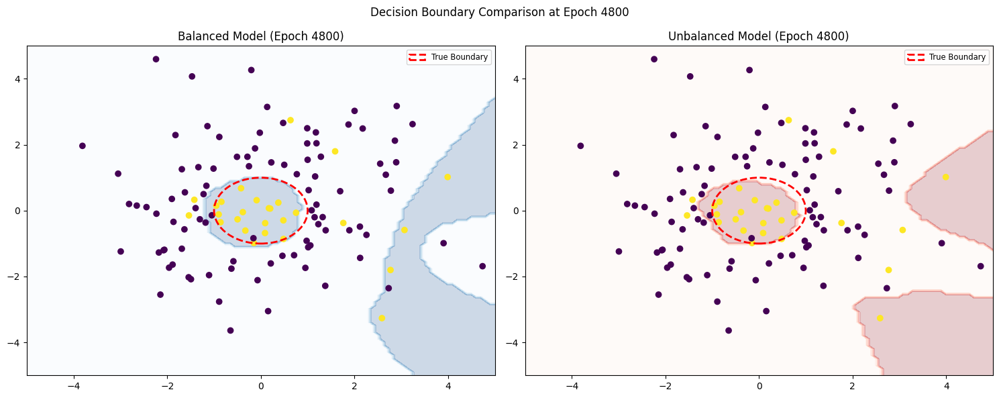

Epoch 4800 | Balanced   - Loss: 0.0808, Acc: 93.33%, W_Norm: 130.61, Balance:   6.6261
           | Unbalanced - Loss: 0.0643, Acc: 92.50%, W_Norm: 278.51, Balance: 6854.6582
----------------------------------------------------------------------------------------------------


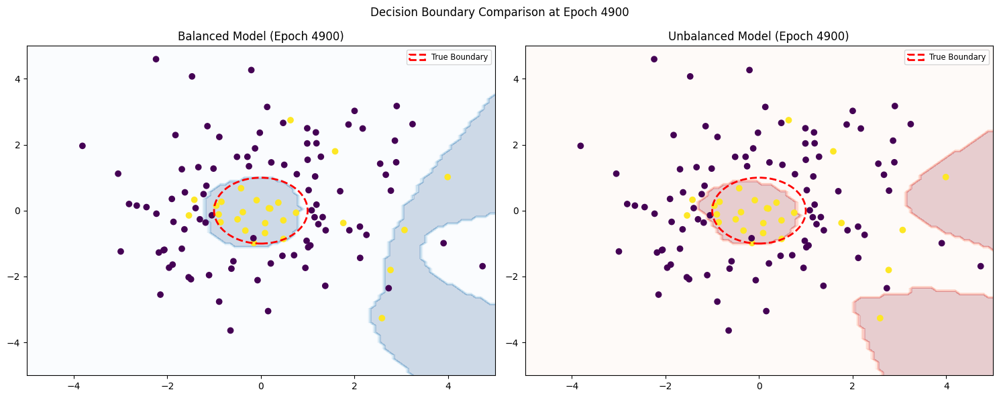

Epoch 4900 | Balanced   - Loss: 0.0798, Acc: 93.33%, W_Norm: 130.59, Balance:   6.4920
           | Unbalanced - Loss: 0.0638, Acc: 92.50%, W_Norm: 278.56, Balance: 6854.1899
----------------------------------------------------------------------------------------------------


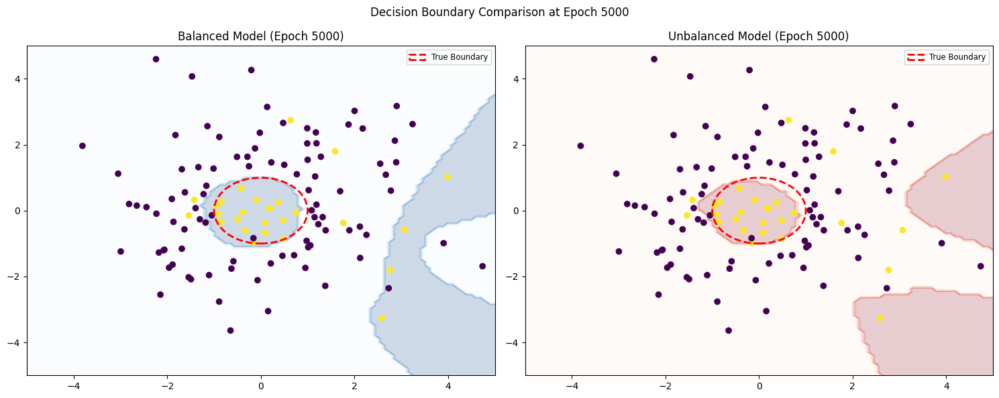

Epoch 5000 | Balanced   - Loss: 0.0789, Acc: 93.33%, W_Norm: 130.57, Balance:   6.3650
           | Unbalanced - Loss: 0.0632, Acc: 92.50%, W_Norm: 278.60, Balance: 6853.6499
----------------------------------------------------------------------------------------------------


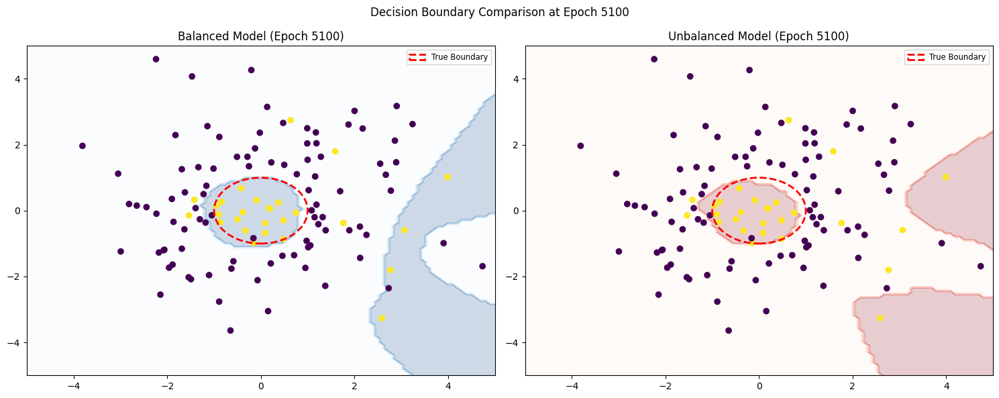

Epoch 5100 | Balanced   - Loss: 0.0780, Acc: 93.33%, W_Norm: 130.55, Balance:   6.2441
           | Unbalanced - Loss: 0.0627, Acc: 92.50%, W_Norm: 278.65, Balance: 6853.0859
----------------------------------------------------------------------------------------------------


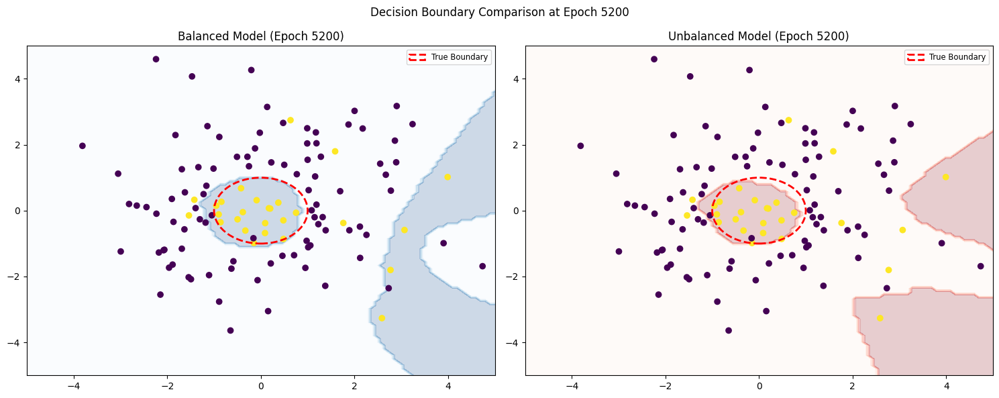

Epoch 5200 | Balanced   - Loss: 0.0771, Acc: 93.33%, W_Norm: 130.54, Balance:   6.1292
           | Unbalanced - Loss: 0.0622, Acc: 92.50%, W_Norm: 278.69, Balance: 6852.4878
----------------------------------------------------------------------------------------------------


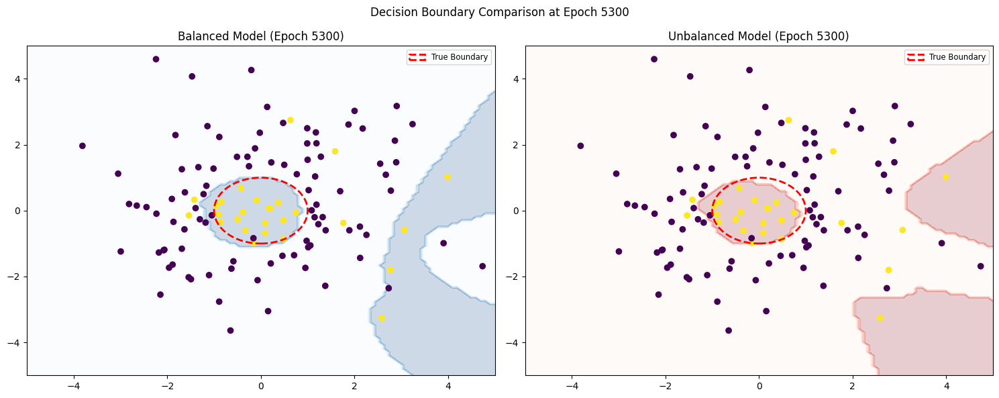

Epoch 5300 | Balanced   - Loss: 0.0763, Acc: 93.33%, W_Norm: 130.52, Balance:   6.0199
           | Unbalanced - Loss: 0.0618, Acc: 92.50%, W_Norm: 278.74, Balance: 6851.8711
----------------------------------------------------------------------------------------------------


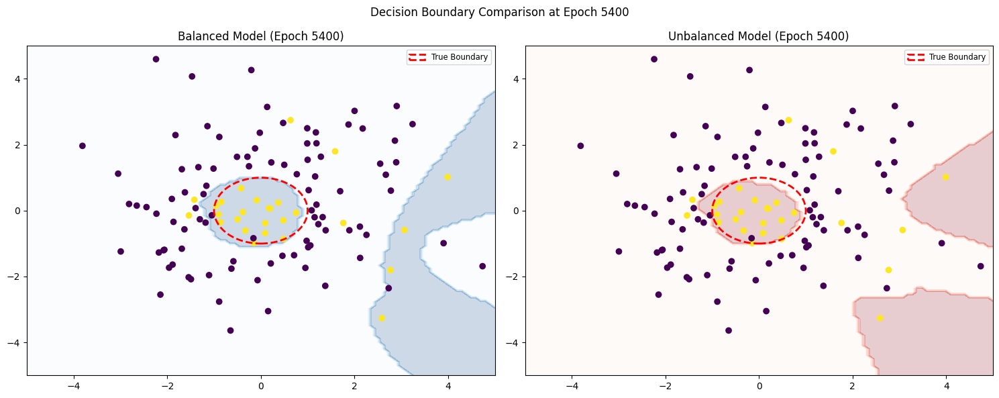

Epoch 5400 | Balanced   - Loss: 0.0755, Acc: 93.33%, W_Norm: 130.51, Balance:   5.9163
           | Unbalanced - Loss: 0.0613, Acc: 92.50%, W_Norm: 278.78, Balance: 6851.2231
----------------------------------------------------------------------------------------------------


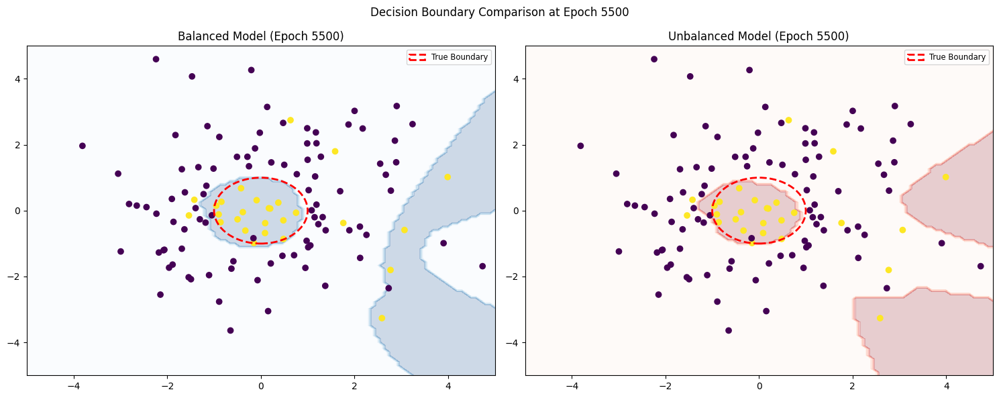

Epoch 5500 | Balanced   - Loss: 0.0747, Acc: 93.33%, W_Norm: 130.49, Balance:   5.8177
           | Unbalanced - Loss: 0.0608, Acc: 92.50%, W_Norm: 278.83, Balance: 6850.5483
----------------------------------------------------------------------------------------------------


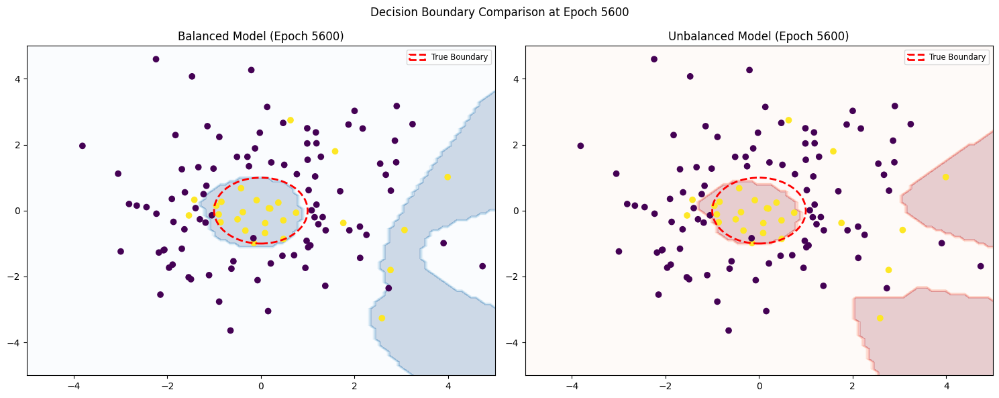

Epoch 5600 | Balanced   - Loss: 0.0739, Acc: 94.17%, W_Norm: 130.47, Balance:   5.7232
           | Unbalanced - Loss: 0.0604, Acc: 92.50%, W_Norm: 278.88, Balance: 6849.8481
----------------------------------------------------------------------------------------------------


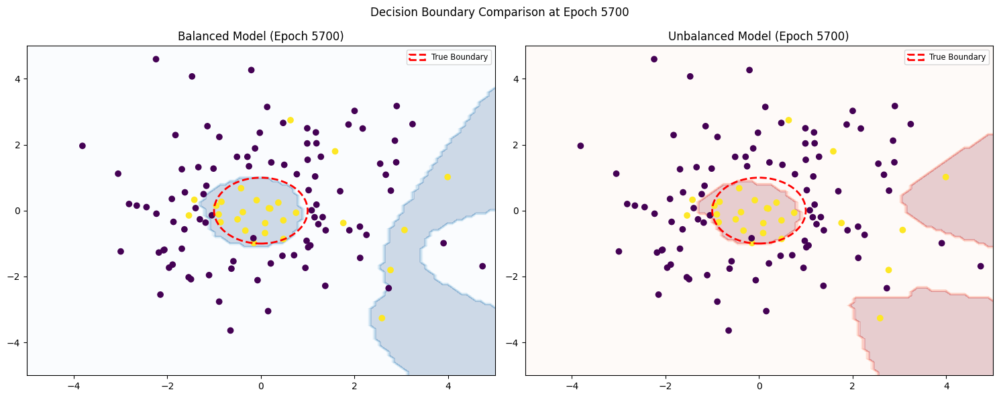

Epoch 5700 | Balanced   - Loss: 0.0732, Acc: 94.17%, W_Norm: 130.46, Balance:   5.6323
           | Unbalanced - Loss: 0.0599, Acc: 92.50%, W_Norm: 278.92, Balance: 6849.1206
----------------------------------------------------------------------------------------------------


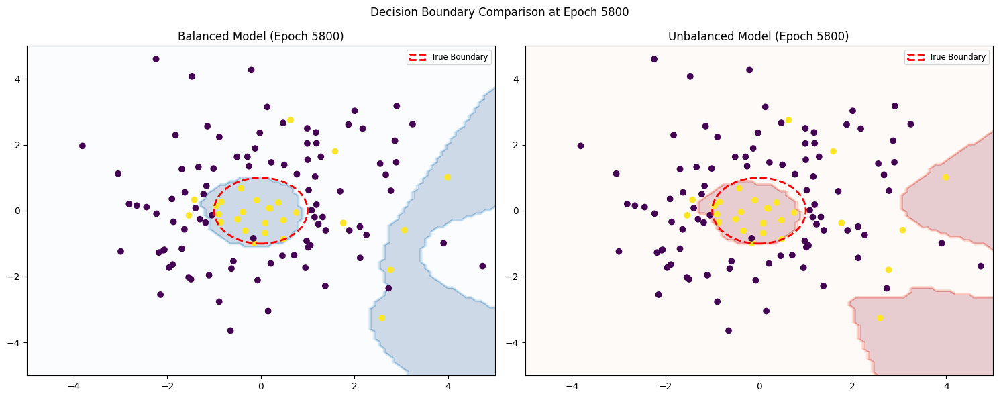

Epoch 5800 | Balanced   - Loss: 0.0724, Acc: 94.17%, W_Norm: 130.44, Balance:   5.5441
           | Unbalanced - Loss: 0.0595, Acc: 92.50%, W_Norm: 278.97, Balance: 6848.4355
----------------------------------------------------------------------------------------------------


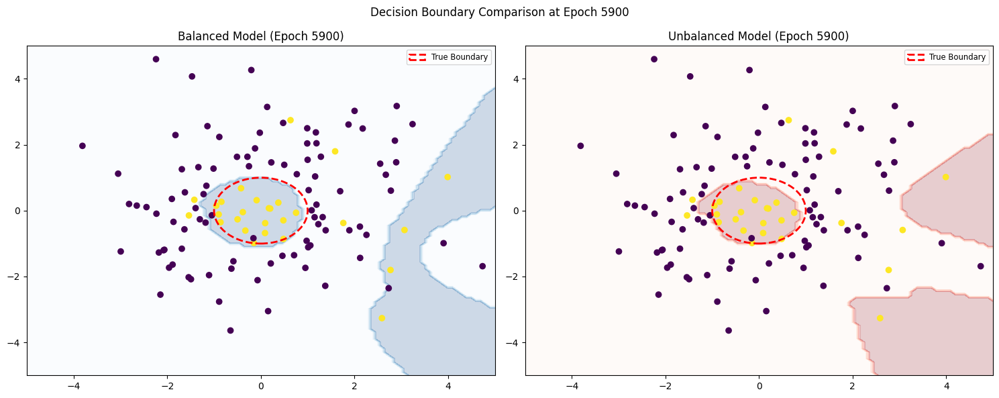

Epoch 5900 | Balanced   - Loss: 0.0717, Acc: 94.17%, W_Norm: 130.43, Balance:   5.4584
           | Unbalanced - Loss: 0.0590, Acc: 92.50%, W_Norm: 279.02, Balance: 6847.7388
----------------------------------------------------------------------------------------------------


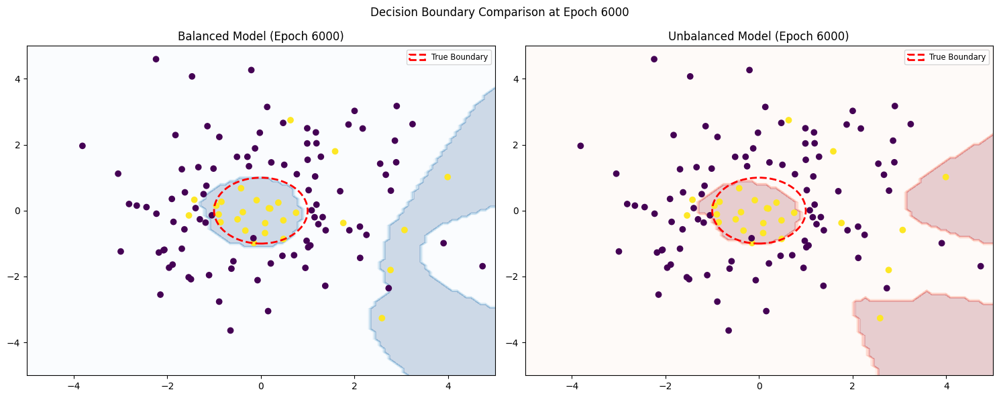

Epoch 6000 | Balanced   - Loss: 0.0710, Acc: 94.17%, W_Norm: 130.42, Balance:   5.3760
           | Unbalanced - Loss: 0.0588, Acc: 92.50%, W_Norm: 279.07, Balance: 6847.0117
----------------------------------------------------------------------------------------------------


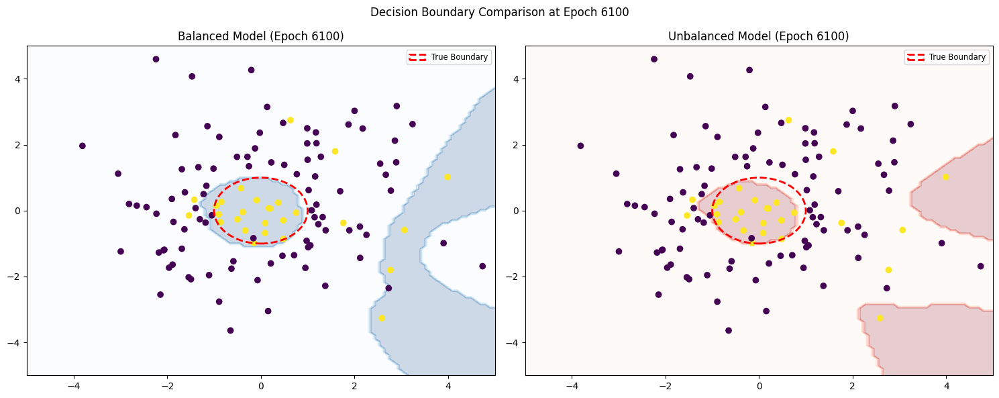

Epoch 6100 | Balanced   - Loss: 0.0704, Acc: 94.17%, W_Norm: 130.40, Balance:   5.2956
           | Unbalanced - Loss: 0.0599, Acc: 92.50%, W_Norm: 279.11, Balance: 6846.0420
----------------------------------------------------------------------------------------------------


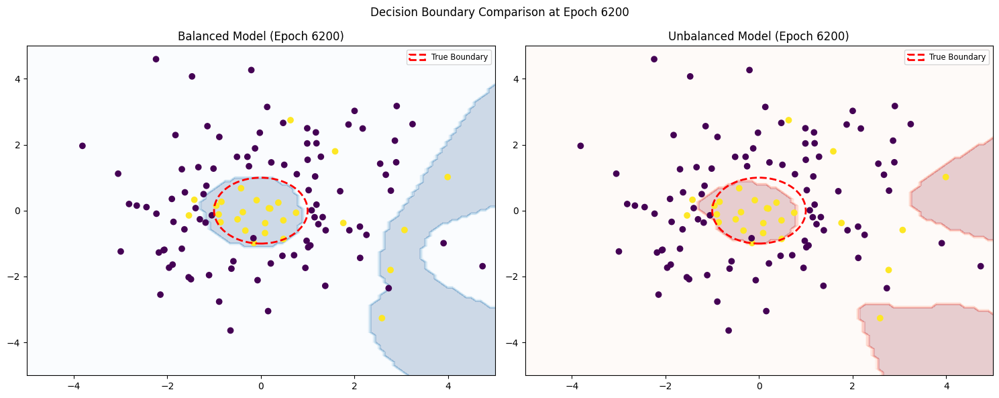

Epoch 6200 | Balanced   - Loss: 0.0699, Acc: 94.17%, W_Norm: 130.39, Balance:   5.2172
           | Unbalanced - Loss: 0.0597, Acc: 92.50%, W_Norm: 279.16, Balance: 6844.9629
----------------------------------------------------------------------------------------------------


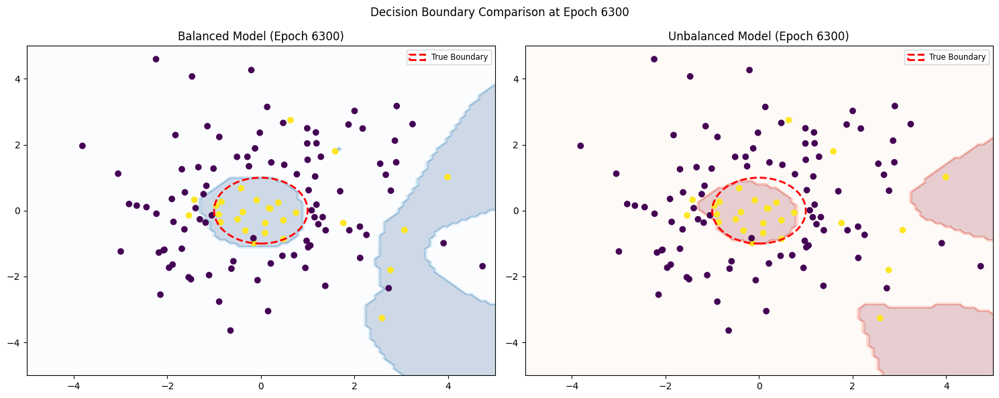

Epoch 6300 | Balanced   - Loss: 0.0716, Acc: 94.17%, W_Norm: 130.38, Balance:   5.1439
           | Unbalanced - Loss: 0.0595, Acc: 92.50%, W_Norm: 279.20, Balance: 6843.8594
----------------------------------------------------------------------------------------------------


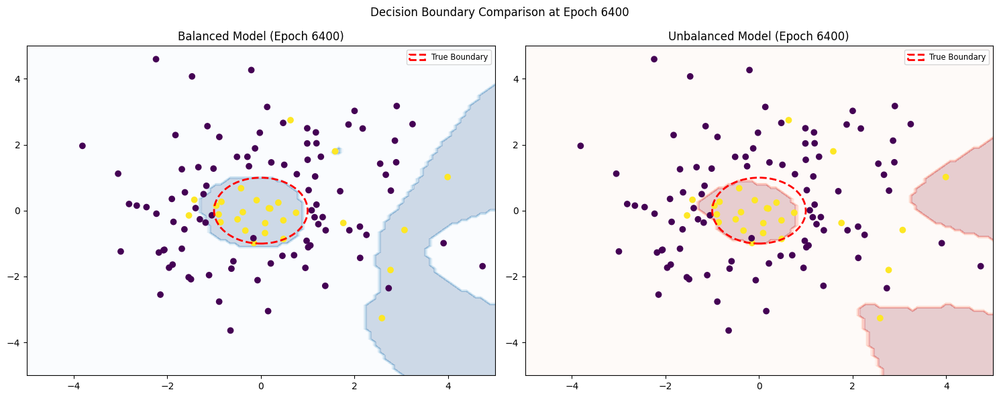

Epoch 6400 | Balanced   - Loss: 0.0716, Acc: 94.17%, W_Norm: 130.36, Balance:   5.0744
           | Unbalanced - Loss: 0.0595, Acc: 92.50%, W_Norm: 279.24, Balance: 6842.7354
----------------------------------------------------------------------------------------------------


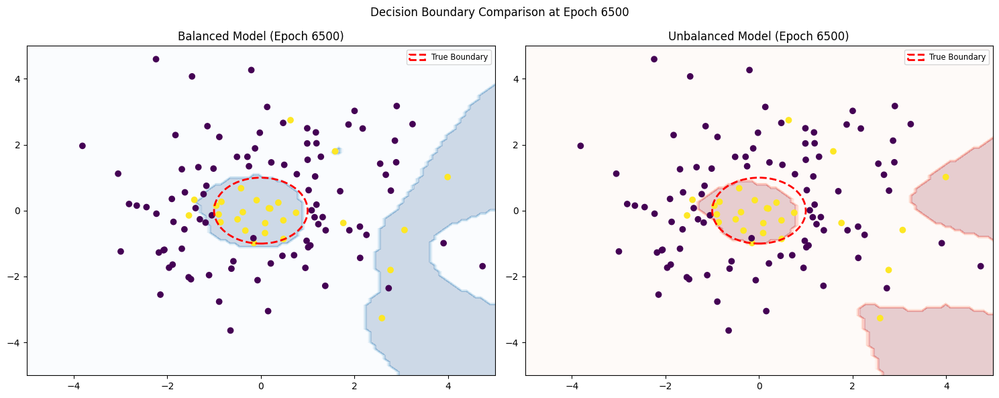

Epoch 6500 | Balanced   - Loss: 0.0718, Acc: 94.17%, W_Norm: 130.34, Balance:   5.0084
           | Unbalanced - Loss: 0.0592, Acc: 93.33%, W_Norm: 279.28, Balance: 6841.5762
----------------------------------------------------------------------------------------------------


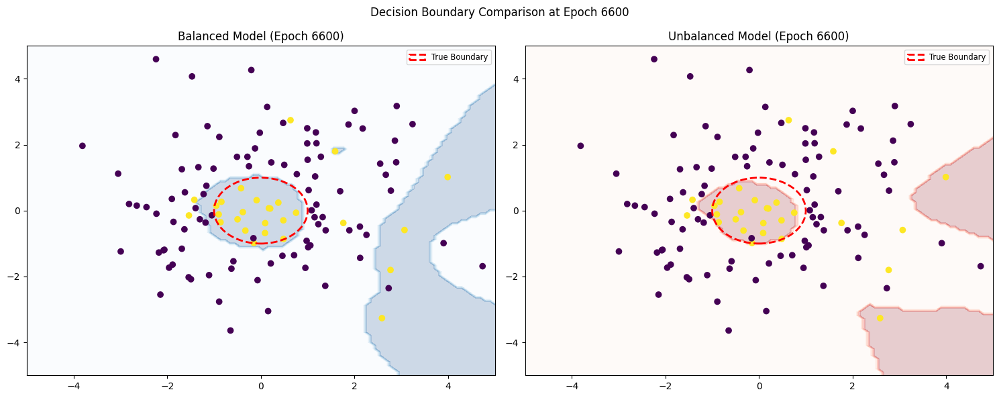

Epoch 6600 | Balanced   - Loss: 0.0719, Acc: 94.17%, W_Norm: 130.32, Balance:   4.9450
           | Unbalanced - Loss: 0.0592, Acc: 93.33%, W_Norm: 279.32, Balance: 6840.3726
----------------------------------------------------------------------------------------------------


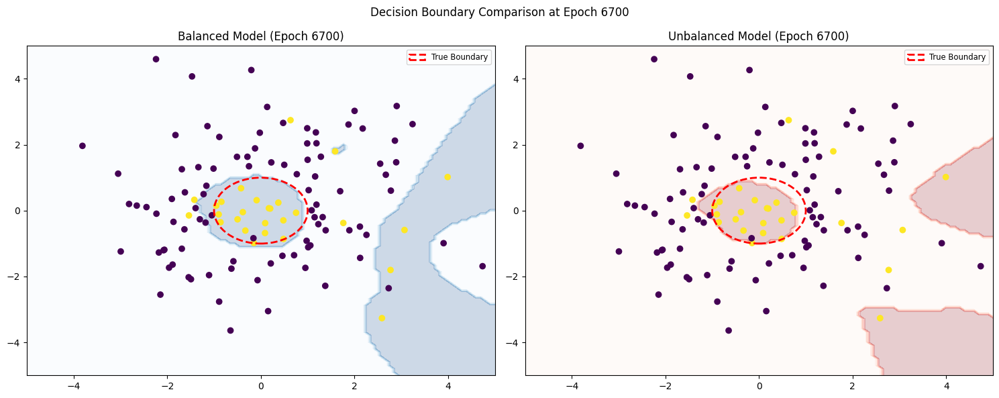

Epoch 6700 | Balanced   - Loss: 0.0709, Acc: 94.17%, W_Norm: 130.30, Balance:   4.8826
           | Unbalanced - Loss: 0.0593, Acc: 93.33%, W_Norm: 279.36, Balance: 6839.1318
----------------------------------------------------------------------------------------------------


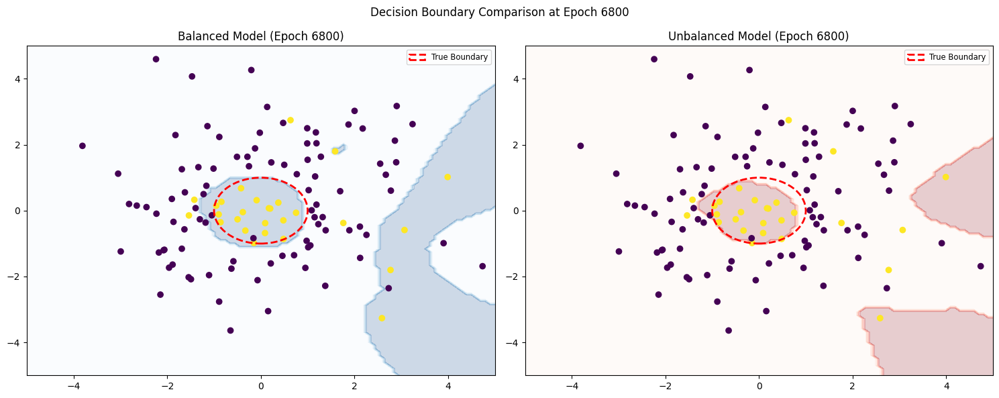

Epoch 6800 | Balanced   - Loss: 0.0694, Acc: 94.17%, W_Norm: 130.29, Balance:   4.8187
           | Unbalanced - Loss: 0.0591, Acc: 93.33%, W_Norm: 279.40, Balance: 6837.7974
----------------------------------------------------------------------------------------------------


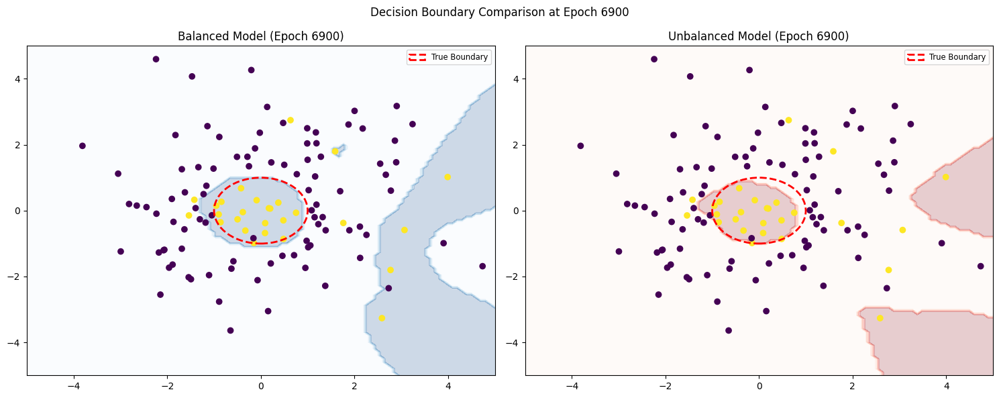

Epoch 6900 | Balanced   - Loss: 0.0682, Acc: 94.17%, W_Norm: 130.28, Balance:   4.7554
           | Unbalanced - Loss: 0.0590, Acc: 93.33%, W_Norm: 279.43, Balance: 6836.3916
----------------------------------------------------------------------------------------------------


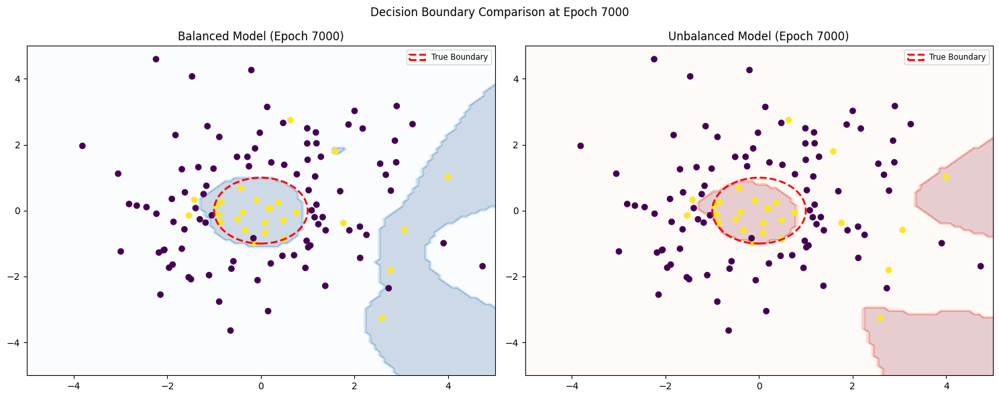

Epoch 7000 | Balanced   - Loss: 0.0688, Acc: 94.17%, W_Norm: 130.27, Balance:   4.6922
           | Unbalanced - Loss: 0.0591, Acc: 93.33%, W_Norm: 279.47, Balance: 6834.9287
----------------------------------------------------------------------------------------------------


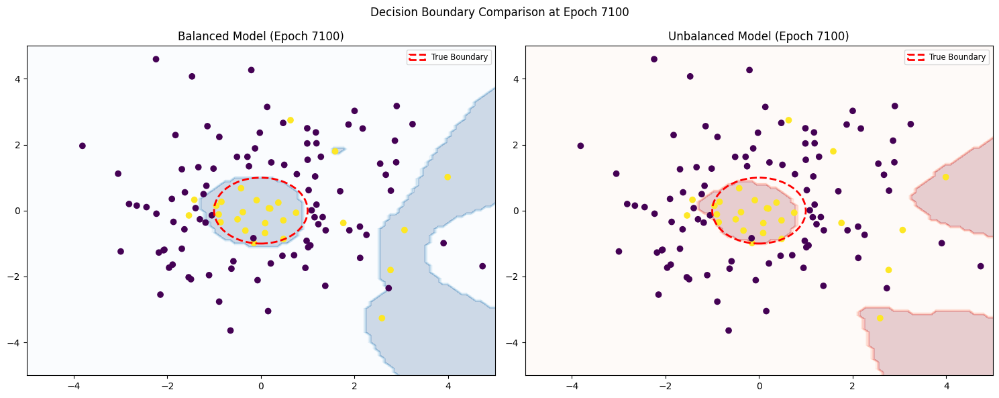

Epoch 7100 | Balanced   - Loss: 0.0659, Acc: 94.17%, W_Norm: 130.27, Balance:   4.6286
           | Unbalanced - Loss: 0.0586, Acc: 93.33%, W_Norm: 279.50, Balance: 6833.4443
----------------------------------------------------------------------------------------------------


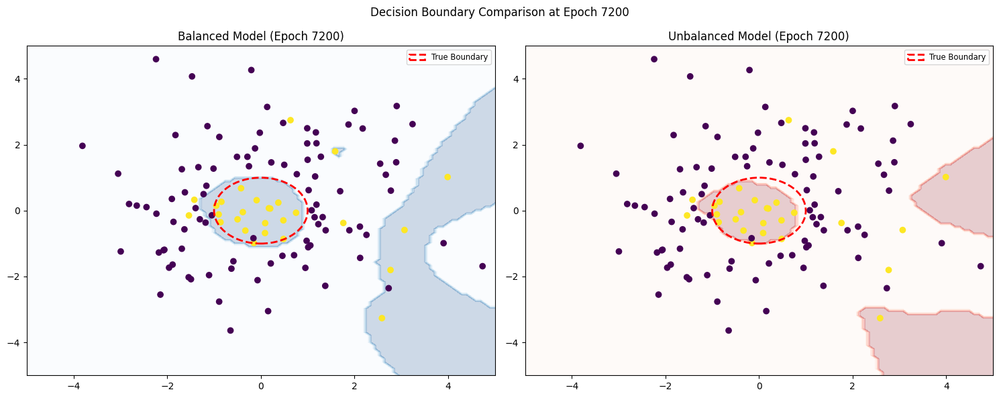

Epoch 7200 | Balanced   - Loss: 0.0668, Acc: 94.17%, W_Norm: 130.27, Balance:   4.5657
           | Unbalanced - Loss: 0.0585, Acc: 93.33%, W_Norm: 279.54, Balance: 6831.9648
----------------------------------------------------------------------------------------------------


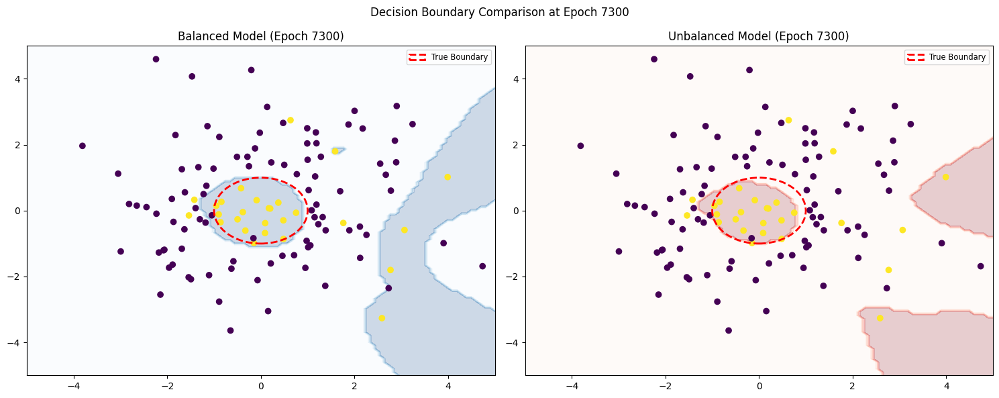

Epoch 7300 | Balanced   - Loss: 0.0645, Acc: 95.00%, W_Norm: 130.26, Balance:   4.5030
           | Unbalanced - Loss: 0.0582, Acc: 93.33%, W_Norm: 279.58, Balance: 6830.4180
----------------------------------------------------------------------------------------------------


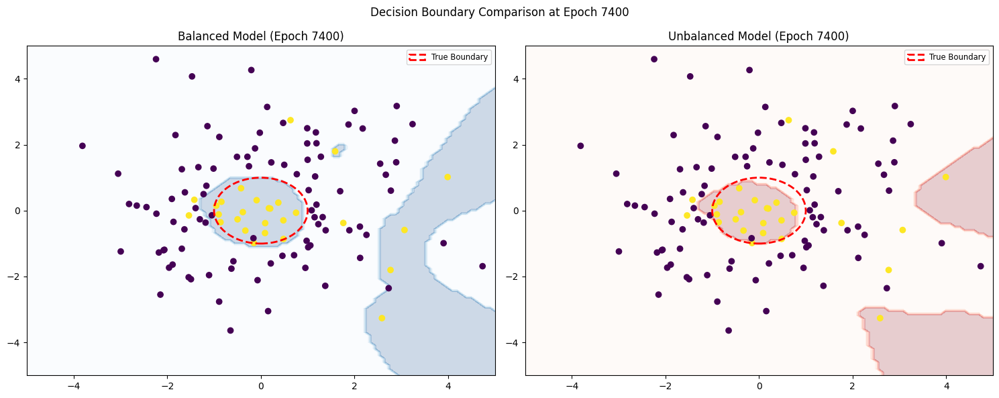

Epoch 7400 | Balanced   - Loss: 0.0641, Acc: 95.00%, W_Norm: 130.26, Balance:   4.4410
           | Unbalanced - Loss: 0.0581, Acc: 93.33%, W_Norm: 279.61, Balance: 6828.8882
----------------------------------------------------------------------------------------------------


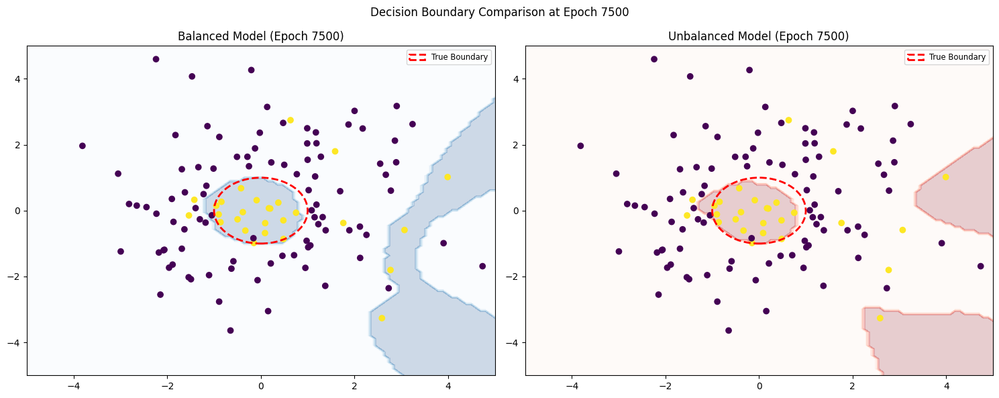

Epoch 7500 | Balanced   - Loss: 0.0636, Acc: 95.00%, W_Norm: 130.26, Balance:   4.3800
           | Unbalanced - Loss: 0.0582, Acc: 93.33%, W_Norm: 279.65, Balance: 6827.3140
----------------------------------------------------------------------------------------------------


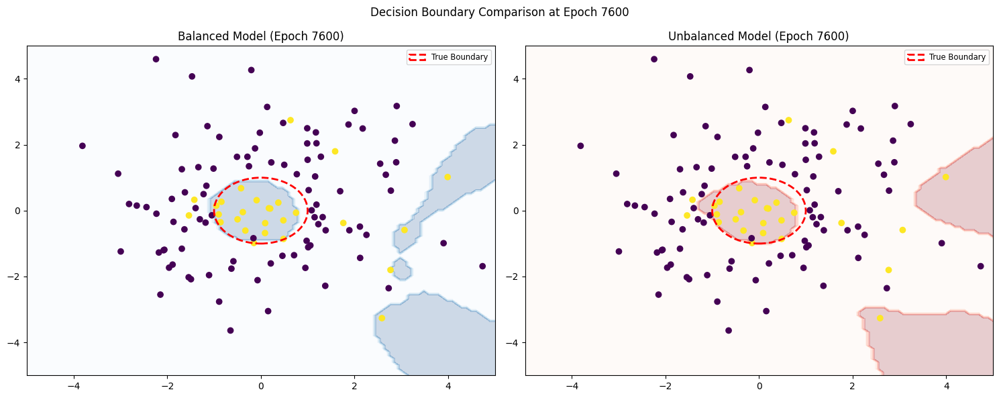

Epoch 7600 | Balanced   - Loss: 0.0671, Acc: 94.17%, W_Norm: 130.26, Balance:   4.3240
           | Unbalanced - Loss: 0.0578, Acc: 93.33%, W_Norm: 279.68, Balance: 6825.6440
----------------------------------------------------------------------------------------------------


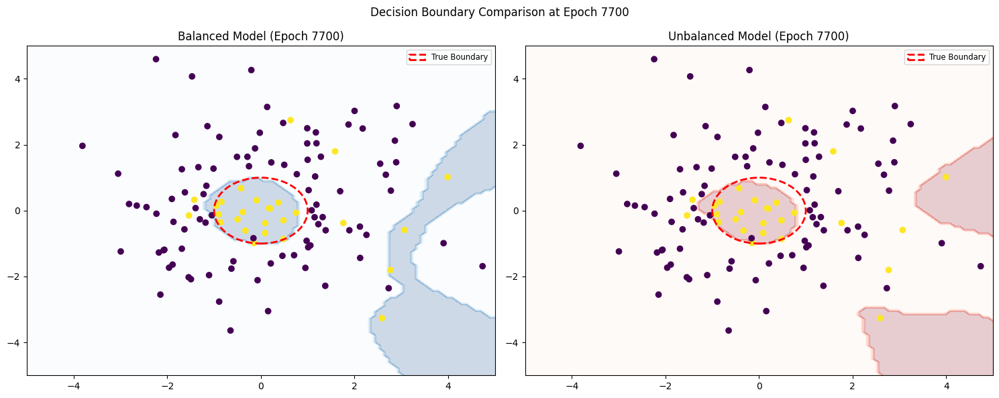

Epoch 7700 | Balanced   - Loss: 0.0642, Acc: 94.17%, W_Norm: 130.26, Balance:   4.2705
           | Unbalanced - Loss: 0.0575, Acc: 93.33%, W_Norm: 279.71, Balance: 6823.9414
----------------------------------------------------------------------------------------------------


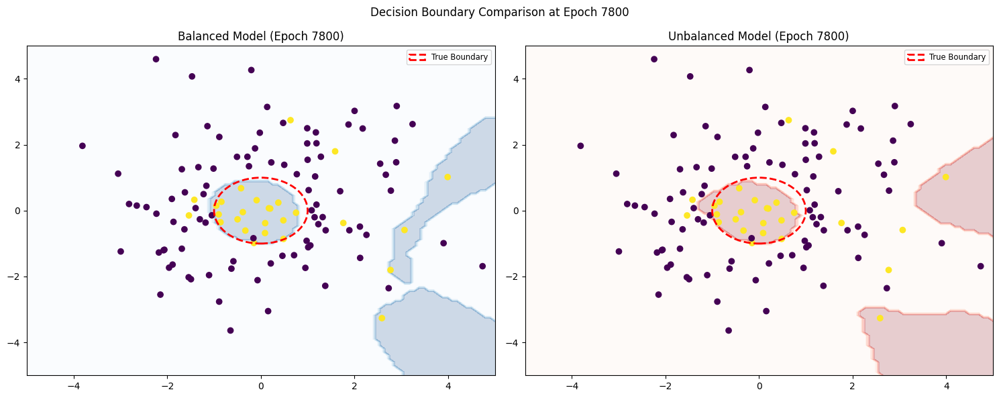

Epoch 7800 | Balanced   - Loss: 0.0652, Acc: 94.17%, W_Norm: 130.26, Balance:   4.2179
           | Unbalanced - Loss: 0.0572, Acc: 93.33%, W_Norm: 279.75, Balance: 6822.2354
----------------------------------------------------------------------------------------------------


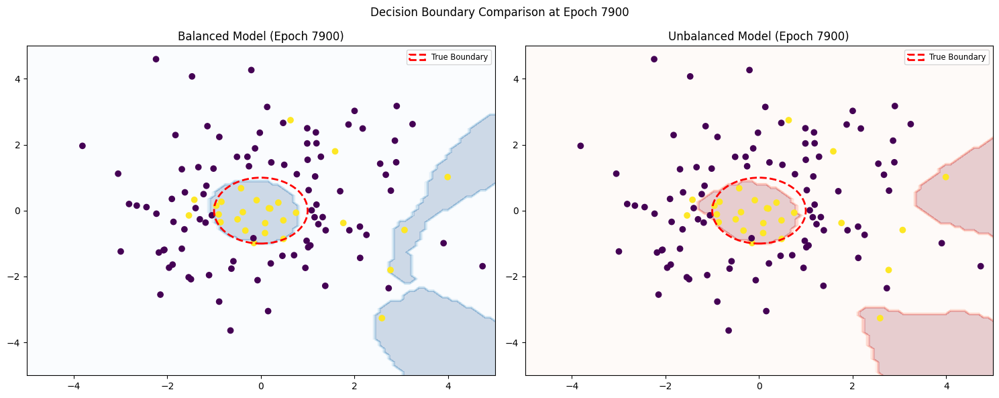

Epoch 7900 | Balanced   - Loss: 0.0648, Acc: 94.17%, W_Norm: 130.26, Balance:   4.1667
           | Unbalanced - Loss: 0.0570, Acc: 93.33%, W_Norm: 279.78, Balance: 6820.5322
----------------------------------------------------------------------------------------------------


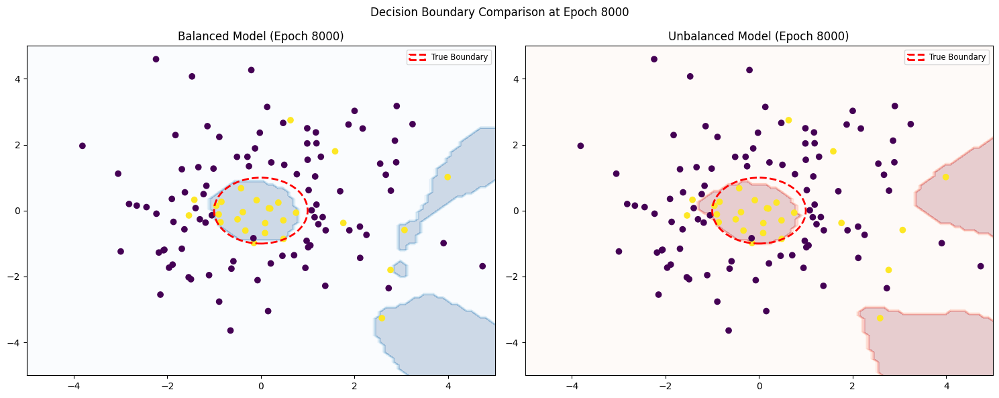

Epoch 8000 | Balanced   - Loss: 0.0666, Acc: 93.33%, W_Norm: 130.26, Balance:   4.1169
           | Unbalanced - Loss: 0.0567, Acc: 93.33%, W_Norm: 279.81, Balance: 6818.8149
----------------------------------------------------------------------------------------------------


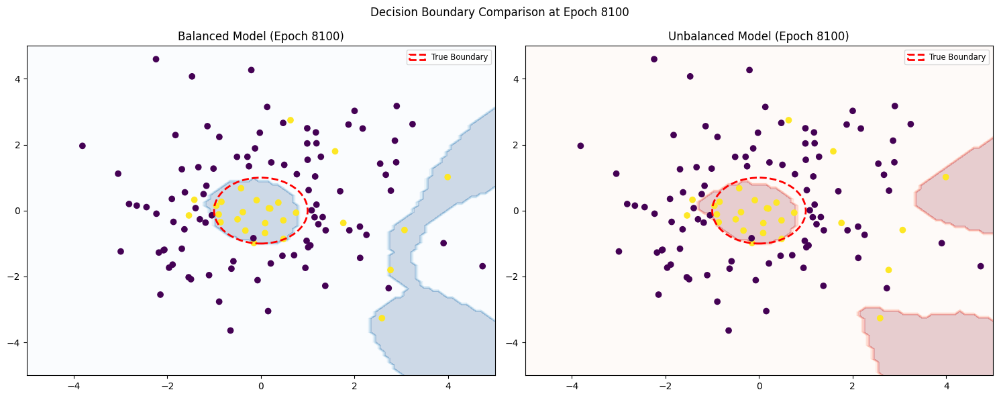

Epoch 8100 | Balanced   - Loss: 0.0631, Acc: 94.17%, W_Norm: 130.26, Balance:   4.0675
           | Unbalanced - Loss: 0.0570, Acc: 93.33%, W_Norm: 279.85, Balance: 6817.0518
----------------------------------------------------------------------------------------------------


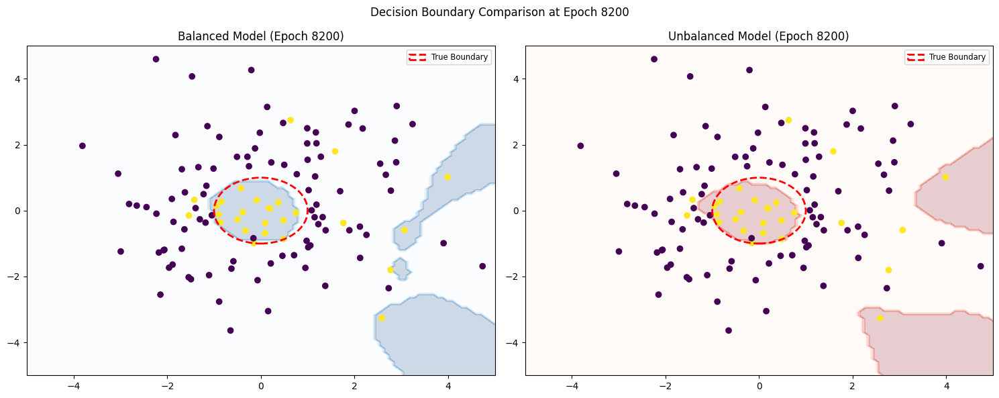

Epoch 8200 | Balanced   - Loss: 0.0652, Acc: 93.33%, W_Norm: 130.26, Balance:   4.0195
           | Unbalanced - Loss: 0.0566, Acc: 93.33%, W_Norm: 279.88, Balance: 6815.2734
----------------------------------------------------------------------------------------------------


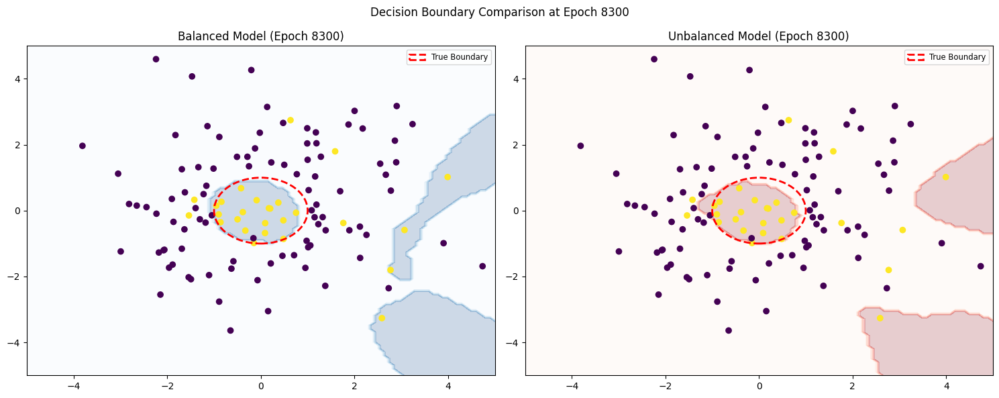

Epoch 8300 | Balanced   - Loss: 0.0638, Acc: 93.33%, W_Norm: 130.25, Balance:   3.9725
           | Unbalanced - Loss: 0.0565, Acc: 93.33%, W_Norm: 279.91, Balance: 6813.4810
----------------------------------------------------------------------------------------------------


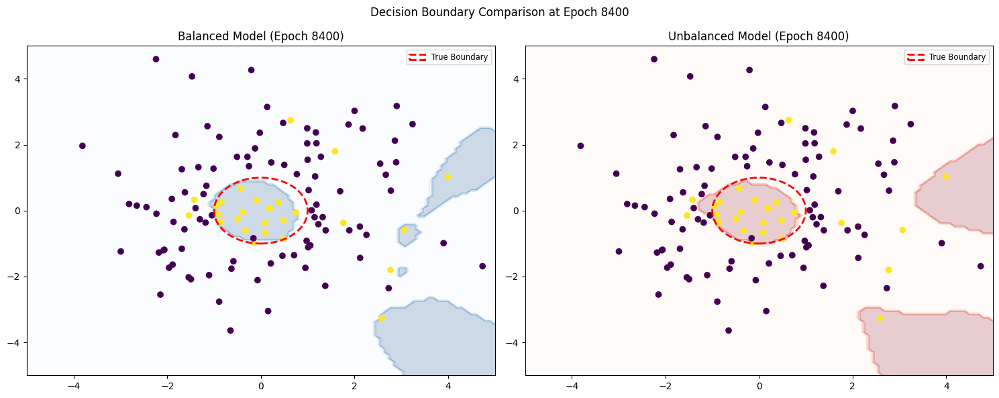

Epoch 8400 | Balanced   - Loss: 0.0662, Acc: 93.33%, W_Norm: 130.25, Balance:   3.9252
           | Unbalanced - Loss: 0.0561, Acc: 93.33%, W_Norm: 279.94, Balance: 6811.7085
----------------------------------------------------------------------------------------------------


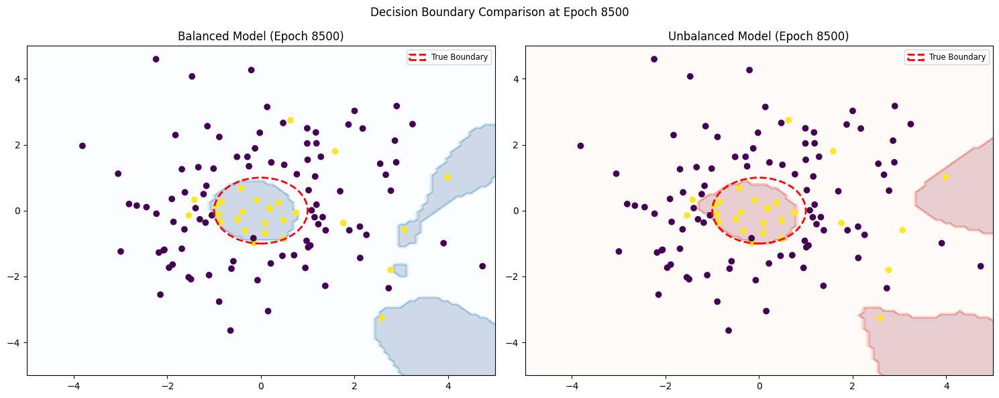

Epoch 8500 | Balanced   - Loss: 0.0651, Acc: 93.33%, W_Norm: 130.25, Balance:   3.8791
           | Unbalanced - Loss: 0.0562, Acc: 91.67%, W_Norm: 279.98, Balance: 6810.0166
----------------------------------------------------------------------------------------------------


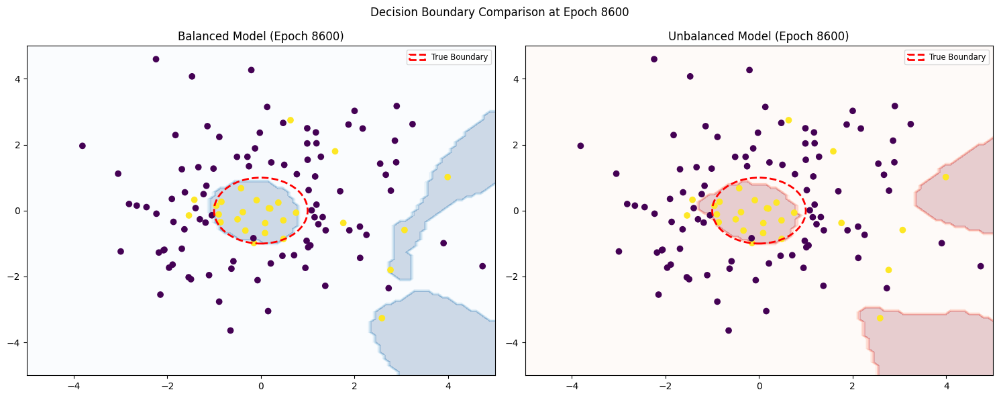

Epoch 8600 | Balanced   - Loss: 0.0628, Acc: 93.33%, W_Norm: 130.24, Balance:   3.8332
           | Unbalanced - Loss: 0.0557, Acc: 92.50%, W_Norm: 280.01, Balance: 6808.1299
----------------------------------------------------------------------------------------------------


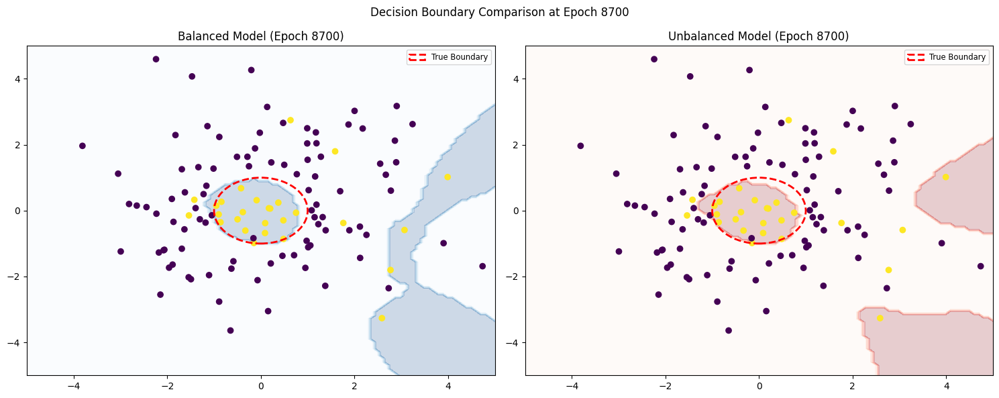

Epoch 8700 | Balanced   - Loss: 0.0611, Acc: 94.17%, W_Norm: 130.24, Balance:   3.7876
           | Unbalanced - Loss: 0.0554, Acc: 92.50%, W_Norm: 280.04, Balance: 6806.2700
----------------------------------------------------------------------------------------------------


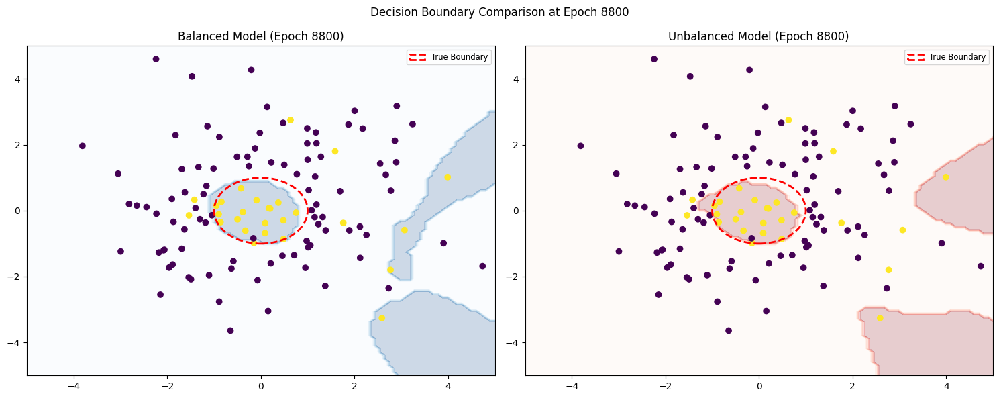

Epoch 8800 | Balanced   - Loss: 0.0619, Acc: 93.33%, W_Norm: 130.24, Balance:   3.7432
           | Unbalanced - Loss: 0.0552, Acc: 92.50%, W_Norm: 280.07, Balance: 6804.4360
----------------------------------------------------------------------------------------------------


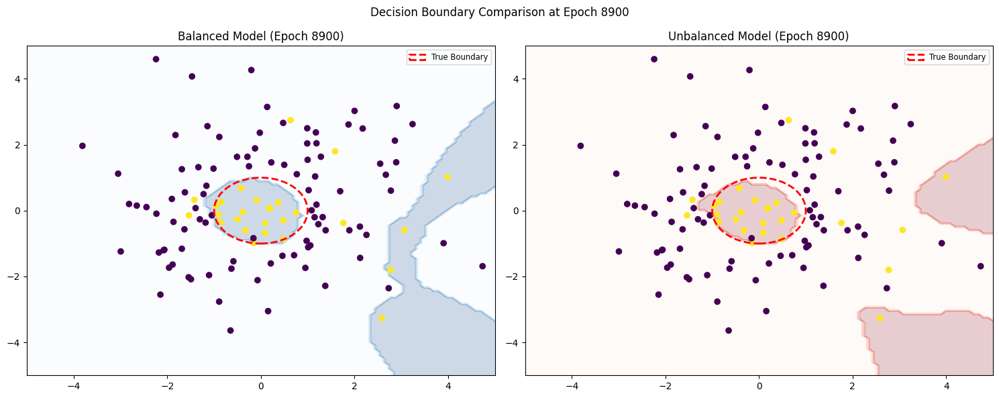

Epoch 8900 | Balanced   - Loss: 0.0602, Acc: 93.33%, W_Norm: 130.23, Balance:   3.6998
           | Unbalanced - Loss: 0.0549, Acc: 92.50%, W_Norm: 280.10, Balance: 6802.6221
----------------------------------------------------------------------------------------------------


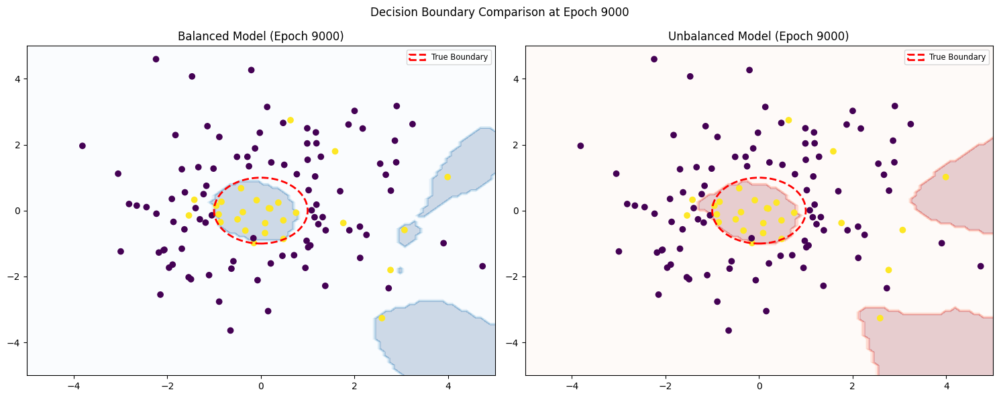

Epoch 9000 | Balanced   - Loss: 0.0643, Acc: 94.17%, W_Norm: 130.23, Balance:   3.6569
           | Unbalanced - Loss: 0.0545, Acc: 92.50%, W_Norm: 280.13, Balance: 6800.7954
----------------------------------------------------------------------------------------------------


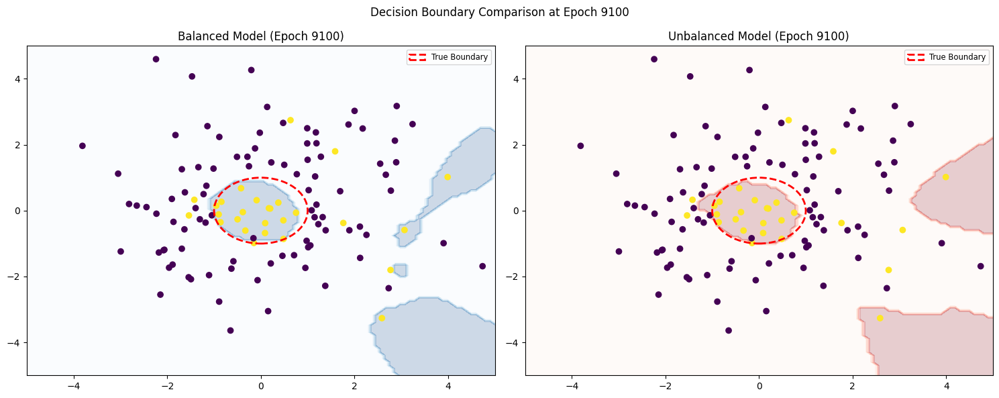

Epoch 9100 | Balanced   - Loss: 0.0636, Acc: 94.17%, W_Norm: 130.22, Balance:   3.6144
           | Unbalanced - Loss: 0.0542, Acc: 92.50%, W_Norm: 280.16, Balance: 6798.9585
----------------------------------------------------------------------------------------------------


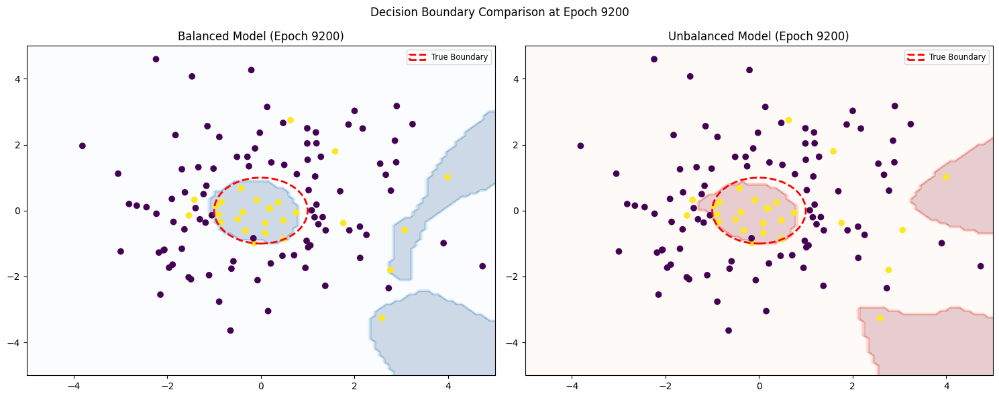

Epoch 9200 | Balanced   - Loss: 0.0609, Acc: 94.17%, W_Norm: 130.22, Balance:   3.5725
           | Unbalanced - Loss: 0.0539, Acc: 92.50%, W_Norm: 280.20, Balance: 6797.1377
----------------------------------------------------------------------------------------------------


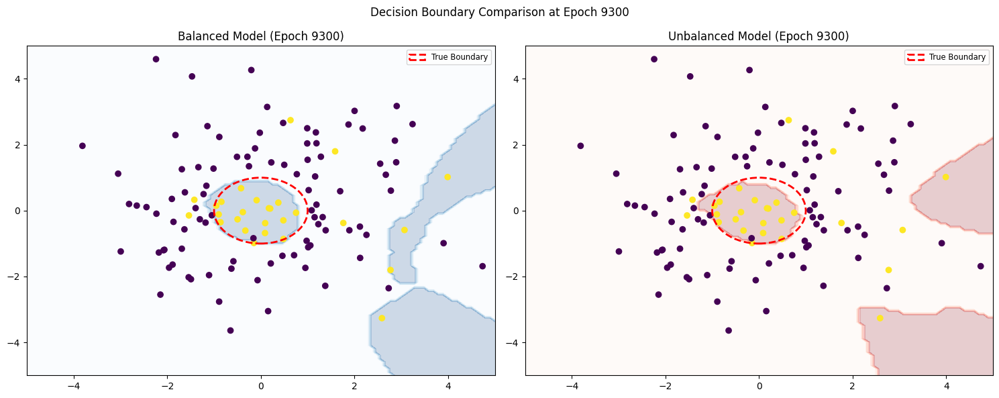

Epoch 9300 | Balanced   - Loss: 0.0596, Acc: 93.33%, W_Norm: 130.21, Balance:   3.5310
           | Unbalanced - Loss: 0.0535, Acc: 92.50%, W_Norm: 280.23, Balance: 6795.3306
----------------------------------------------------------------------------------------------------


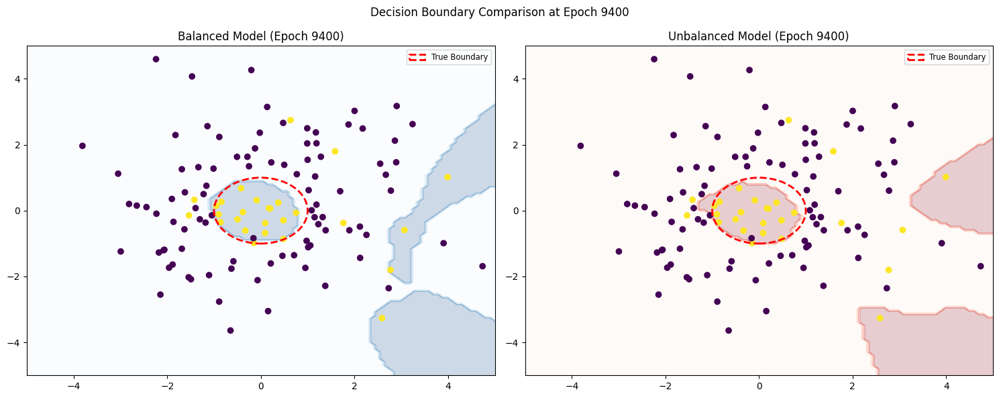

Epoch 9400 | Balanced   - Loss: 0.0591, Acc: 94.17%, W_Norm: 130.20, Balance:   3.4903
           | Unbalanced - Loss: 0.0533, Acc: 92.50%, W_Norm: 280.26, Balance: 6793.5283
----------------------------------------------------------------------------------------------------


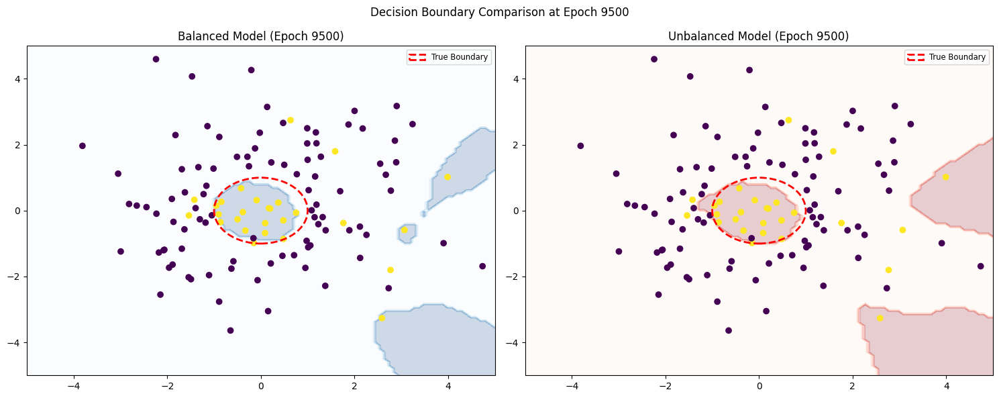

Epoch 9500 | Balanced   - Loss: 0.0638, Acc: 94.17%, W_Norm: 130.20, Balance:   3.4510
           | Unbalanced - Loss: 0.0529, Acc: 92.50%, W_Norm: 280.30, Balance: 6791.7075
----------------------------------------------------------------------------------------------------


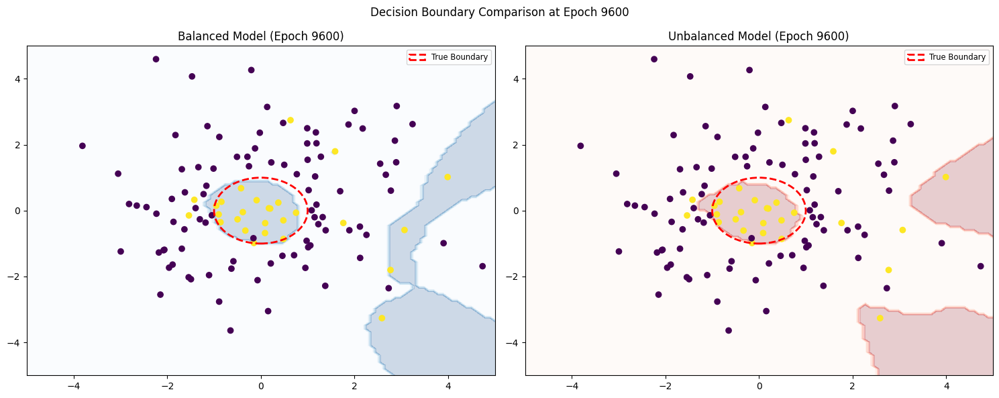

Epoch 9600 | Balanced   - Loss: 0.0586, Acc: 93.33%, W_Norm: 130.19, Balance:   3.4114
           | Unbalanced - Loss: 0.0526, Acc: 92.50%, W_Norm: 280.33, Balance: 6789.8975
----------------------------------------------------------------------------------------------------


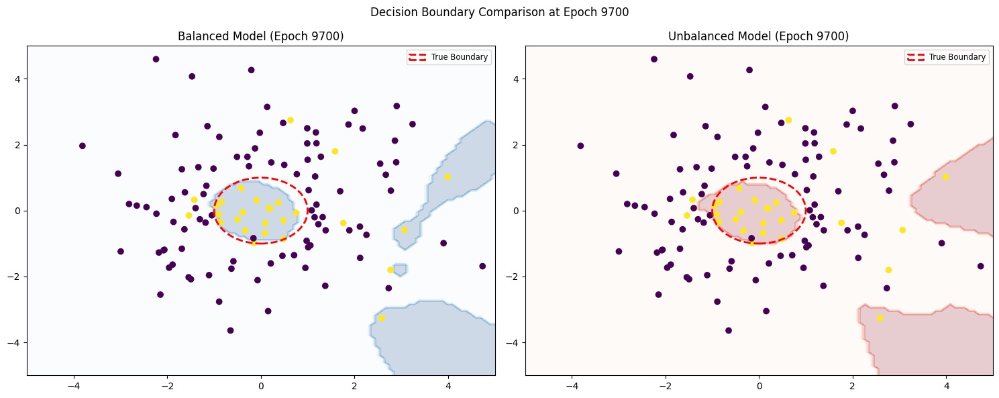

Epoch 9700 | Balanced   - Loss: 0.0618, Acc: 93.33%, W_Norm: 130.19, Balance:   3.3717
           | Unbalanced - Loss: 0.0523, Acc: 92.50%, W_Norm: 280.36, Balance: 6788.0884
----------------------------------------------------------------------------------------------------


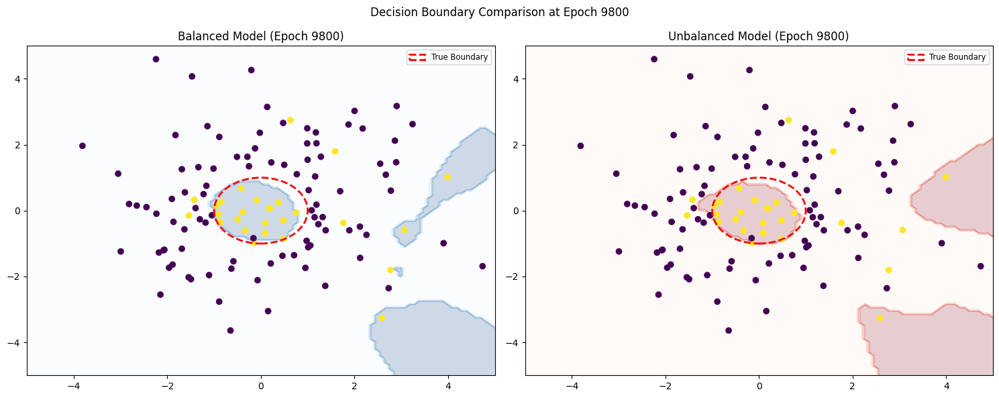

Epoch 9800 | Balanced   - Loss: 0.0631, Acc: 94.17%, W_Norm: 130.19, Balance:   3.3324
           | Unbalanced - Loss: 0.0520, Acc: 92.50%, W_Norm: 280.40, Balance: 6786.3921
----------------------------------------------------------------------------------------------------


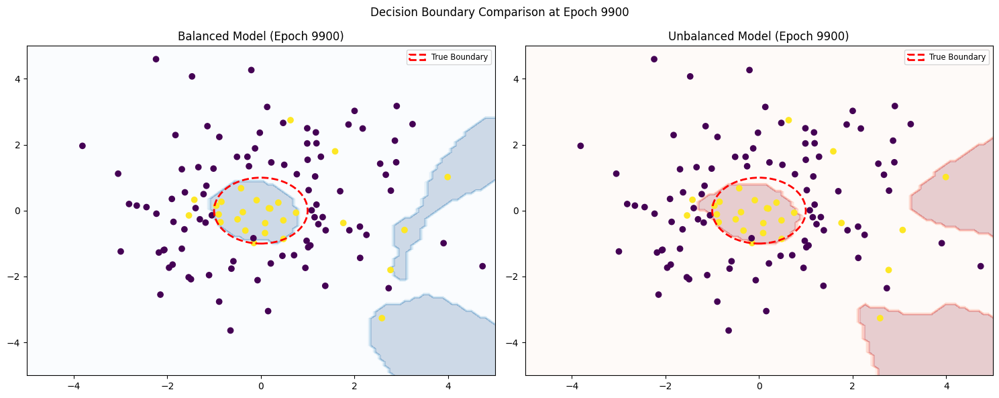

Epoch 9900 | Balanced   - Loss: 0.0600, Acc: 94.17%, W_Norm: 130.18, Balance:   3.2938
           | Unbalanced - Loss: 0.0517, Acc: 93.33%, W_Norm: 280.43, Balance: 6784.7109
----------------------------------------------------------------------------------------------------


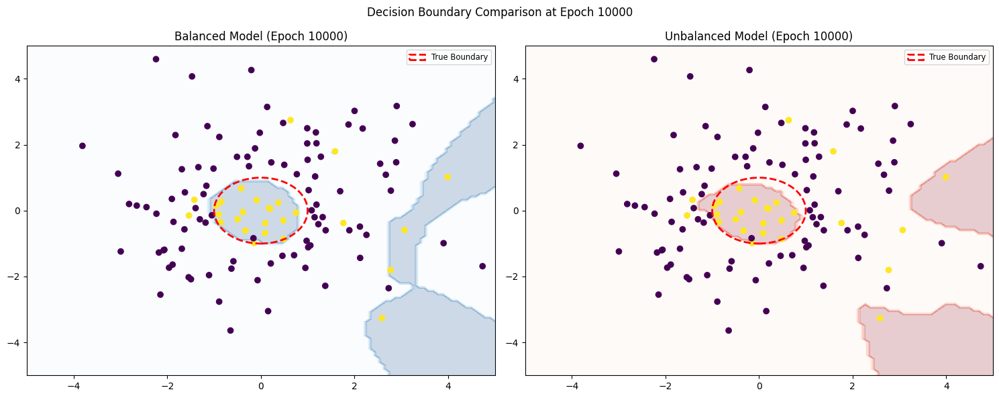

Epoch 10000 | Balanced   - Loss: 0.0564, Acc: 95.00%, W_Norm: 130.18, Balance:   3.2562
           | Unbalanced - Loss: 0.0514, Acc: 93.33%, W_Norm: 280.47, Balance: 6783.0557
----------------------------------------------------------------------------------------------------


In [ ]:
import random
# Set the seed for reproducibility
seed = 40

random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)

# If you ever use a GPU, you need these as well:
if torch.cuda.is_available():
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    # Ensure deterministic behavior for convolutional layers
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
# 1. Initialize both models
model = BalancedNet()
u_model = BalancedNet()

# 2. Copy the weights from 'model' to 'u_model'
# This ensures every single synapse starts with the exact same value
u_model.load_state_dict(model.state_dict())

# 3. Double-check (Optional but good for Member 1 to verify)
with torch.no_grad():
    diff = torch.sum(model.layers[0].weight - u_model.layers[0].weight)
    print(f"Initial weight difference: {diff.item()}") # Should be 0.0

optimizer = torch.optim.SGD(model.parameters(), lr=0.005)
u_optimizer = torch.optim.SGD(u_model.parameters(), lr=0.005)

criterion = RecursiveBalanceLoss(alpha=0.0003, beta=0.0008)
u_criterion = RecursiveBalanceLoss(alpha=0, beta=0)

# 1. 100 Points near the origin (Target 1: "Inside")
origin_points = torch.randn(100, 2) * 1.5  # Tight cluster
origin_targets = (torch.norm(origin_points, dim=1, keepdim=True) < 1.0).float()

# 2. 5 Points centered at (2.5, 2.5) (Target 0: "Outside")
far_points = (torch.randn(5, 2) * 0.5) + torch.tensor([2.5, 2.5])
far_targets = torch.zeros(5, 1)
inner_points = (torch.randn(5, 2) * 0.5) + torch.tensor([-1, -1])
inner_targets = torch.zeros(5, 1)
far_outliers_points = (torch.randn(10, 2) * 2) + torch.tensor([0, 0])
far_outliers_targets = torch.ones(10, 1)
# Combine into one dataset
inputs = torch.cat([
                    origin_points,
                    far_points,
                    inner_points,
                    far_outliers_points,
                    ], dim=0)
targets = torch.cat([
                     origin_targets,
                     far_targets,
                     inner_targets,
                     far_outliers_targets,
                     ], dim=0)

# Shuffle the data so the model doesn't see all 1s then all 0s
indices = torch.randperm(inputs.size(0))
inputs = inputs[indices]
targets = targets[indices]
history = []
for epoch in range(10001): # Ran to 101 to see the final result
    # --- Balanced Model Step ---
    optimizer.zero_grad()
    outputs = model(inputs)
    loss = criterion(outputs, targets, model)
    loss.backward()
    optimizer.step()

    # --- Unbalanced Model Step ---
    u_optimizer.zero_grad()
    u_outputs = u_model(inputs)
    u_loss = u_criterion(u_outputs, targets, u_model)
    u_loss.backward()
    u_optimizer.step()
    if epoch%1 == 0 and epoch > 0:
        acc = get_accuracy(outputs, targets)
        u_acc = get_accuracy(u_outputs, targets)

        b_balance = get_network_balance(model)
        u_balance = get_network_balance(u_model)

        with torch.no_grad():
            b_norm = sum(torch.norm(p)**2 for p in model.parameters())
            u_norm = sum(torch.norm(p)**2 for p in u_model.parameters())
        history.append({
            'epoch': epoch,
            'b_loss': loss.item(), 'u_loss': u_loss.item(),
            'b_acc': acc, 'u_acc': u_acc,
            'b_norm': b_norm, 'u_norm': u_norm,
            'b_balance': b_balance, 'u_balance': u_balance
        })
        if epoch%100 == 0:
          plot_decision_boundaries(model, u_model, inputs=inputs, targets=targets, epoch=epoch)
          print(f"Epoch {epoch:4d} | Balanced   - Loss: {loss.item():.4f}, Acc: {acc:.2%}, W_Norm: {b_norm:6.2f}, Balance: {b_balance:8.4f}")
          print(f"           | Unbalanced - Loss: {u_loss.item():.4f}, Acc: {u_acc:.2%}, W_Norm: {u_norm:6.2f}, Balance: {u_balance:8.4f}")
          print("-" * 100)


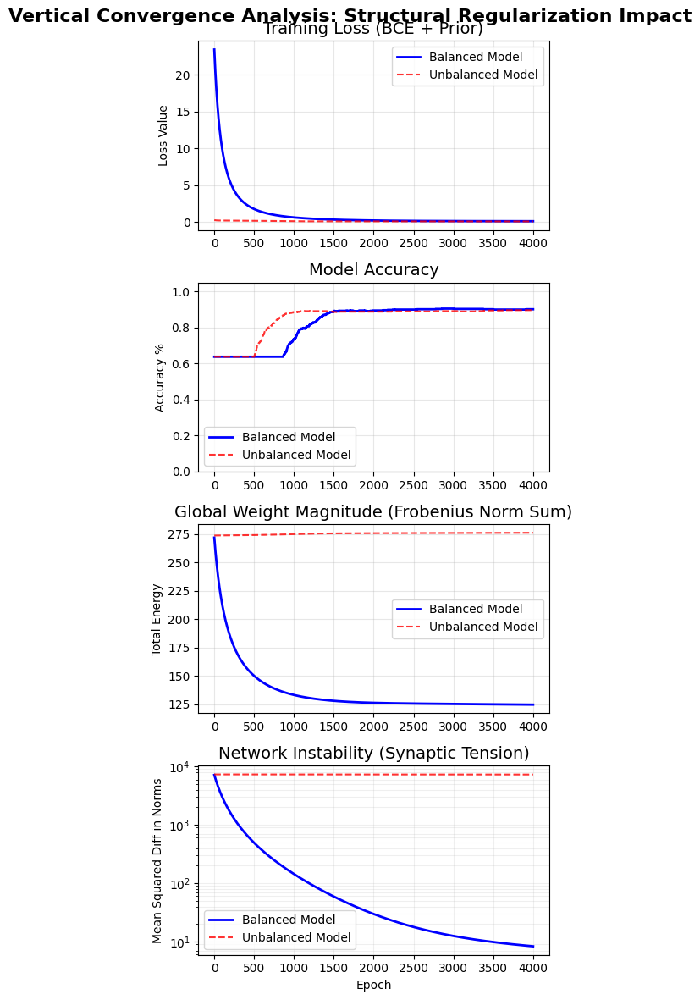

In [ ]:
# @title
import matplotlib.pyplot as plt
import pandas as pd

# 1. Create a vertical stack (4 rows, 1 column)
# Increase height to 20 or 24 to give each plot room to breathe
fig, axes = plt.subplots(4, 1, figsize=(5, 12))
df = pd.DataFrame(history)

# Assign axes for clarity
ax_loss = axes[0]
ax_acc  = axes[1]
ax_norm = axes[2]
ax_bal  = axes[3]

# --- 1. Loss Plot ---
ax_loss.plot(df['epoch'], df['b_loss'], label='Balanced Model', color='blue', linewidth=2)
ax_loss.plot(df['epoch'], df['u_loss'], label='Unbalanced Model', color='red', linestyle='--', alpha=0.8)
ax_loss.set_title('Training Loss (BCE + Prior)', fontsize=14)
ax_loss.set_ylabel('Loss Value')
ax_loss.grid(True, alpha=0.3)
ax_loss.legend()

# --- 2. Accuracy Plot ---
ax_acc.plot(df['epoch'], df['b_acc'], label='Balanced Model', color='blue', linewidth=2)
ax_acc.plot(df['epoch'], df['u_acc'], label='Unbalanced Model', color='red', linestyle='--', alpha=0.8)
ax_acc.set_title('Model Accuracy', fontsize=14)
ax_acc.set_ylabel('Accuracy %')
ax_acc.set_ylim(0, 1.05)
ax_acc.grid(True, alpha=0.3)
ax_acc.legend()

# --- 3. Weight Norm Plot ---
ax_norm.plot(df['epoch'], df['b_norm'], label='Balanced Model', color='blue', linewidth=2)
ax_norm.plot(df['epoch'], df['u_norm'], label='Unbalanced Model', color='red', linestyle='--', alpha=0.8)
ax_norm.set_title('Global Weight Magnitude (Frobenius Norm Sum)', fontsize=14)
ax_norm.set_ylabel('Total Energy')
ax_norm.grid(True, alpha=0.3)
ax_norm.legend()

# --- 4. Balance Metric Plot ---
ax_bal.plot(df['epoch'], df['b_balance'], label='Balanced Model', color='blue', linewidth=2)
ax_bal.plot(df['epoch'], df['u_balance'], label='Unbalanced Model', color='red', linestyle='--', alpha=0.8)
ax_bal.set_title('Network Instability (Synaptic Tension)', fontsize=14)
ax_bal.set_ylabel('Mean Squared Diff in Norms')
ax_bal.set_xlabel('Epoch')
ax_bal.set_yscale('log')
ax_bal.grid(True, which="both", ls="-", alpha=0.2)
ax_bal.legend()



plt.tight_layout(rect=[0, 0, 1, 0.98])
plt.suptitle("Vertical Convergence Analysis: Structural Regularization Impact", fontsize=16, fontweight='bold')
plt.show()